# Install Packages

In [ ]:
# !pip install --force-reinstall numpy==1.26.4

In [1]:
!pip install mogptk diffrax pykoopman pydmd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.0/35.0 MB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.2/193.2 kB 25.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 kB 19.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 90.3 MB/s eta 0:00:00
  

# Import Libraries

In [3]:
# System Packages
import os
import time

# Data manipulation
import numpy as np
import pandas as pd

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# For Bayesian Inference
import arviz as az
import pymc as pm
import pytensor
import pytensor.tensor as pt
from numba import njit
from pymc.ode import DifferentialEquation
from pytensor.compile.ops import as_op
from scipy.integrate import odeint, solve_ivp
from scipy.optimize import least_squares, curve_fit
from scipy.signal import detrend, savgol_filter

# MOGPTK
import torch
import mogptk

# NCDE
import diffrax
import equinox as eqx  # https://github.com/patrick-kidger/equinox
import jax
import jax.nn as jnn
import jax.numpy as jnp
import jax.random as jr
import jax.scipy as jsp
import optax  # https://github.com/deepmind/optax

# PyKoopman
import pykoopman as pk
from pydmd import DMD

# Performance metrics
from sklearn.metrics import r2_score
import networkx as nx

THEANO_FLAGS = "optimizer=fast_compile"

print(f"PyMC3 Version: {pm.__version__}")
print(f"NumPy Version: {np.__version__}")
print(f"PyTensor Version: {pytensor.__version__}")

PyMC3 Version: 5.22.0
NumPy Version: 1.26.0
PyTensor Version: 2.30.3


# Import Plant Oscillator Data

Pulled from this paper: https://www.nature.com/articles/ncomms8641#Abs1

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
thesis_path = "/content/drive/MyDrive/Grad_Stuff/Masters/Research Thesis/"
plots_path = os.path.join(thesis_path, "plots/")
plots_arab_path = os.path.join(plots_path, "arabidopsis/")
data_path = os.path.join(thesis_path, "data/")
arab_path = os.path.join(data_path, "arabidopsis_thaliana/")

arab_df = pd.read_csv(os.path.join(arab_path, "arabidopsis_thaliana.csv"))

# Put data in T x G format
arab_df = arab_df.T
arab_df.columns = arab_df.iloc[0]
arab_df = arab_df.iloc[1:]
arab_df = arab_df.reset_index()
arab_df = arab_df.rename(columns = {'index': 'time'})
arab_df = arab_df.astype(float)
# arab_df.time = arab_df.time.astype(int)

arab_df.head()

time,time,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,0.0,8.674295,3.254499,5.438053,6.446412,3.621461,6.176346,6.690822,7.641649,8.355742
1,6.0,8.636278,3.218845,5.308466,6.438937,3.607936,5.933316,6.695470,7.654588,8.303825
2,9.0,8.318323,3.253269,6.011237,5.403289,3.595273,5.926065,6.449853,7.362833,8.359823
3,12.0,7.984514,4.764364,7.591106,4.610065,3.693014,5.578596,5.216216,6.831526,8.250675
4,15.0,7.703215,6.810083,8.638449,5.055169,3.593076,5.270672,5.104439,6.898392,8.205036


<AxesSubplot:xlabel='time'>

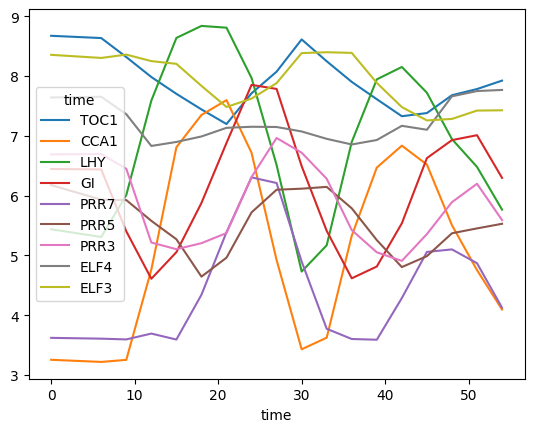

In [5]:
arab_df.plot(x = 'time')

# Transform Data

## Method 1 : Interpolation and moving average

<AxesSubplot:xlabel='time'>

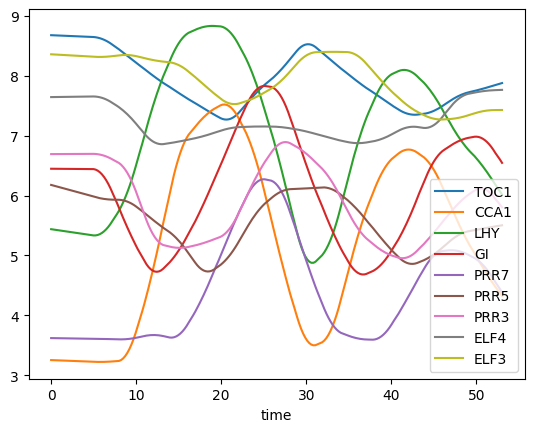

In [6]:
# more granular time resolution

# configs
min_time, max_time = arab_df.time.values[0], arab_df.time.values[-1]
n_points_interp = 200
window = 10

tt2 = np.linspace(min_time, max_time, n_points_interp)

# concatenates high-res timepoints tt2 with dataset and orders it.
arab_interp = pd.concat([pd.DataFrame({'time':tt2}), arab_df], axis=0).sort_values(by = 'time').interpolate()

# Then we can interpolate the intermediate points using moving avg
# We tried to do sine FFT but the initial guesses prevented the sine function and curve_fit from fitting.
arab_smooth = arab_interp.iloc[1:, :].rolling(window).mean()
arab_smooth.iloc[:window, :] = arab_interp.iloc[:window, :]

# Since rolling(x) will remove the first x points, populate this with the original high-res, non-differentiable set of x
arab_smooth.iloc[:window, :] = arab_interp.iloc[:window, :]

# remove first point with NaNs
arab_smooth = arab_smooth.iloc[1:, :]

# in case there are duplicate time values
arab_smooth = arab_smooth.groupby('time').mean().reset_index()

arab_smooth.plot(x = 'time')

In [7]:
arab_smooth.shape

(216, 10)

In [8]:
# Check for nulls
arab_smooth.isnull().sum()

,0
time,0
TOC1,0
CCA1,0
LHY,0
GI,0
PRR7,0
PRR5,0
PRR3,0
ELF4,0
ELF3,0


Awesome, no nulls!

# [DO NOT RUN] Method 2 : Savgol Filter

This can work but we wont have more data which is the point of doing these transformations in the first place

<AxesSubplot:xlabel='time'>

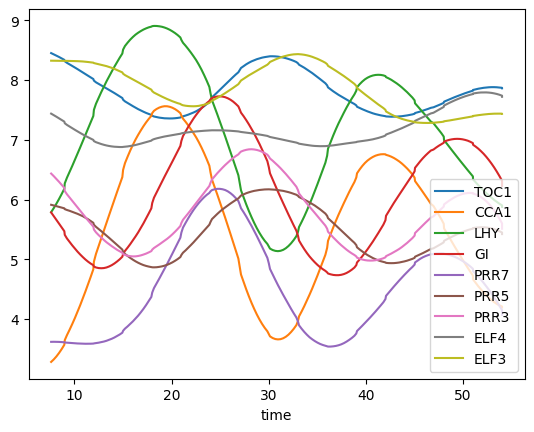

In [7]:
# This can also work
window_length = 60
polyorder = 3

arab_smooth = arab_interp.copy()

arab_smooth.iloc[:, 1:] = savgol_filter(x = arab_smooth.iloc[:, 1:].T,
                                          window_length = window_length,
                                          polyorder = polyorder).T

arab_smooth = np.trunc(arab_smooth * 1000) / 1000
arab_smooth.plot(x = 'time')

# [DO NOT RUN] Method 3: Fast Fourier Transform

This did not work because the curve_fit cannot guess and run the interpolation model

In [ ]:
def fit_sin(tt, yy):
    '''Fit sin to the input time sequence, and return fitting parameters "amp", "omega", "phase", "offset", "freq", "period" and "fitfunc"'''
    tt = np.array(tt)
    yy = np.array(yy)
    ff = np.fft.fftfreq(len(tt), (tt[1]-tt[0]))   # assume uniform spacing
    Fyy = abs(np.fft.fft(yy))
    guess_freq = abs(ff[np.argmax(Fyy[1:])+1])   # excluding the zero frequency "peak", which is related to offset
    guess_amp = np.std(yy) * 2.**0.5
    guess_offset = np.mean(yy)
    guess_trend = (yy[-1] - yy[0])/(tt[-1] - tt[0])
    guess = np.array([guess_amp, 2.*np.pi*guess_freq, 0., guess_offset, guess_trend])

    def sinfunc(t, A, w, p, c, d):
      return A * np.sin(w*t + p) + c + d*t

    popt, pcov = curve_fit(sinfunc, tt, yy, p0=guess)
    A, w, p, c, d = popt
    f = w/(2.*np.pi)
    fitfunc = lambda t: A * np.sin(w*t + p) + c + d * t
    return {"amp": A, "omega": w, "phase": p, "offset": c, "trend": d, "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": np.max(pcov), "rawres": (guess,popt,pcov)}

In [ ]:
arab_smooth.iloc[:, 1:] = arab_smooth.iloc[:, 1:].interpolate()

In [ ]:
arab_smooth_dict = dict()

arab_smooth_dict['time'] = tt2

for col in arab_df.columns[1:]:

  res = fit_sin(tt = arab_smooth.time.values, yy = arab_smooth[col].values)
  arab_smooth_dict[col] = res["fitfunc"](tt2)

arab_smooth = pd.DataFrame(arab_smooth_dict)
arab_smooth.time = arab_smooth.time.round(3)
arab_smooth.plot(x = 'time')

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1200.

# Helper Functions Across Methods

In [9]:
def regular_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean((true_df - pred_df) ** 2)


def pooled_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean(np.mean((pred_df - true_df) ** 2, axis = 0))



In [10]:
arab_smooth.head()

,time,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,0.000000,8.674295,3.254499,5.438053,6.446412,3.621461,6.176346,6.690822,7.641649,8.355742
1,0.271357,8.672642,3.252949,5.432419,6.446087,3.620873,6.165780,6.691024,7.642212,8.353485
2,0.542714,8.670989,3.251399,5.426785,6.445762,3.620285,6.155213,6.691226,7.642774,8.351227
3,0.814070,8.669337,3.249848,5.421150,6.445437,3.619697,6.144647,6.691428,7.643337,8.348970
4,1.085427,8.667684,3.248298,5.415516,6.445112,3.619109,6.134080,6.691631,7.643899,8.346713


In [11]:
G = nx.Graph()

G.add_edge('CCA1', 'TOC1', weight=-1)
G.add_edge('CCA1', 'LHY', weight=-1)
G.add_edge('TOC1', 'PRR7', weight=-1)
G.add_edge('TOC1', 'PRR5', weight=-1)
G.add_edge('TOC1', 'CCA1', weight=-1)
G.add_edge('TOC1', 'LHY', weight=-1)
G.add_edge('PRR7', 'CCA1', weight=-1)
G.add_edge('PRR7', 'LHY', weight=-1)
G.add_edge('CCA1', 'PRR7', weight=1)
G.add_edge('CCA1', 'PRR5', weight=1)
G.add_edge('LHY', 'PRR7', weight=1)
G.add_edge('LHY', 'PRR5', weight=1)
G.add_edge('PRR5', 'CCA1', weight=-1)
G.add_edge('PRR5', 'LHY', weight=-1)
G.add_edge('PRR3', 'TOC1', weight=1)
G.add_edge('ELF4', 'PRR7', weight=-1)
G.add_edge('ELF4', 'PRR5', weight=-1)
G.add_edge('ELF3', 'PRR7', weight=-1)
G.add_edge('ELF3', 'PRR5', weight=-1)
G.add_edge('CCA1', 'ELF4', weight=-1)
G.add_edge('CCA1', 'ELF3', weight=-1)
G.add_edge('LHY', 'ELF4', weight=-1)
G.add_edge('LHY', 'ELF3', weight=-1)
G.add_edge('GI', 'TOC1', weight=-1)





G.adjacency()

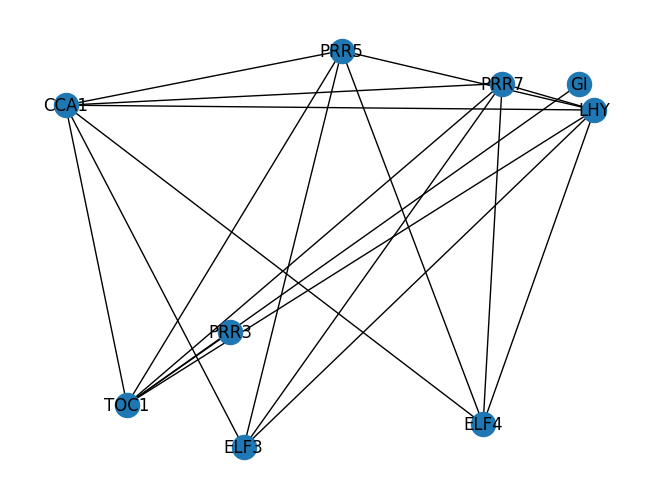

In [12]:
nx.draw(G, with_labels = True)

In [13]:
true_adjacency = nx.to_pandas_adjacency(G, nodelist = G.nodes())
true_adjacency = true_adjacency.loc[arab_smooth.columns[1:],
                                    arab_smooth.columns[1:]]
true_adjacency

,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
TOC1,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,0.0,0.0
CCA1,-1.0,0.0,-1.0,0.0,1.0,-1.0,0.0,-1.0,-1.0
LHY,-1.0,-1.0,0.0,0.0,1.0,-1.0,0.0,-1.0,-1.0
GI,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
PRR7,-1.0,1.0,1.0,0.0,0.0,0.0,0.0,-1.0,-1.0
PRR5,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,-1.0,-1.0
PRR3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ELF4,0.0,-1.0,-1.0,0.0,-1.0,-1.0,0.0,0.0,0.0
ELF3,0.0,-1.0,-1.0,0.0,-1.0,-1.0,0.0,0.0,0.0


In [14]:
def binarize(x):
  if x > 0:
    return 1
  elif x < 0:
    return -1
  else:
    return 0

def compare_coupling(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """
  binary_pred = pred_df.map(binarize)
  return np.linalg.norm(binary_pred - true_df)



# Plot Data

<ipython-input-15-e279f1acf1f6>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "arab_original_data.png"))
<ipython-input-15-e279f1acf1f6>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "arab_original_data.png"))
<ipython-input-15-e279f1acf1f6>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "arab_original_data.png"))
<ipython-input-15-e279f1acf1f6>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as 

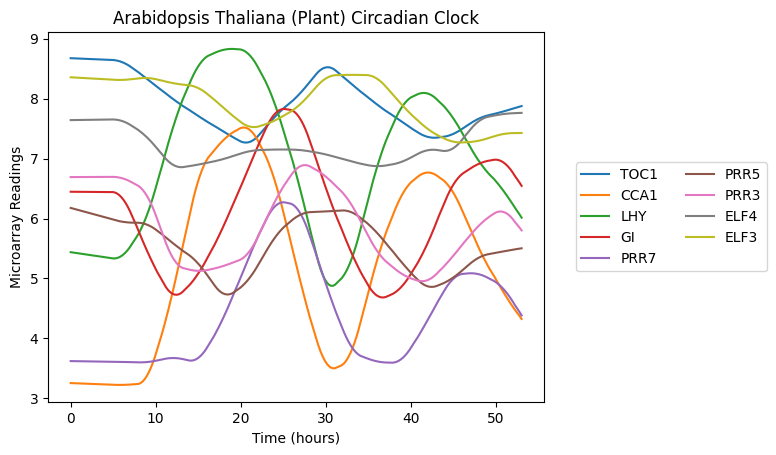

In [15]:
arab_smooth.plot(x = 'time')

plt.xlabel('Time (hours)')
plt.ylabel('Microarray Readings')
plt.title('Arabidopsis Thaliana (Plant) Circadian Clock')
plt.legend(bbox_to_anchor=(1.05, 0.5), ncol=2, loc='center left')
plt.savefig(os.path.join(plots_arab_path, "arab_original_data.png"))

In [16]:
# Get colnames
clock_cols = arab_smooth\
  .drop(['time'], axis = 1, inplace = False)\
  .columns.tolist()


In [11]:
len(clock_cols)

9

# MOGP

## MOGP Configs

In [17]:
TRAIN_HIST = 35
TRAIN_HIST

35

## MOGP Data Prep

In [18]:
mogptk_data = mogptk.DataSet()

for i, clock_col in enumerate(clock_cols):
    mogptk_data.append(mogptk.Data(arab_smooth['time'], arab_smooth[clock_col], name = clock_col))
    mogptk_data.transform(mogptk.TransformDetrend(degree=1))
    mogptk_data[i].remove_range(start = TRAIN_HIST)
    # mogptk_data[i].remove_range(start = 0, end = 30)
    # mogptk_data[i] # remove frome nd

(<Figure size 1200x3600 with 9 Axes>,
 array([[<AxesSubplot:title={'center':'TOC1'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'CCA1'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'LHY'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'GI'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'PRR7'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'PRR5'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'PRR3'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'ELF4'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'ELF3'}, xlabel='X', ylabel='Y'>]],
       dtype=object))

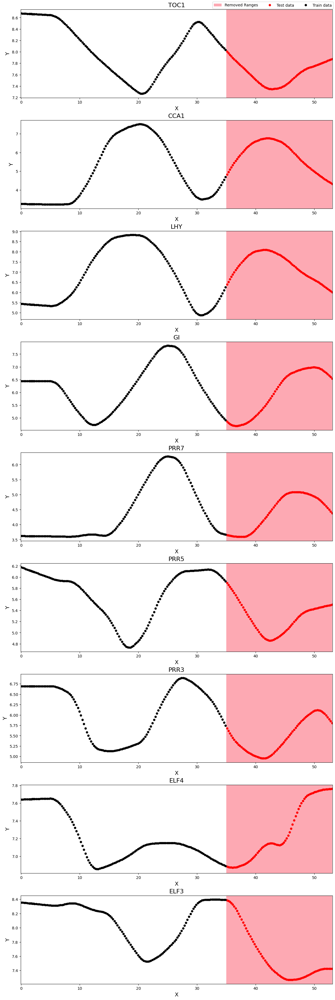

In [19]:
mogptk_data.plot()

## MOGP Training

In [20]:
# create model, uncomment for different kernels
mogptk_model = mogptk.MOSM(mogptk_data, Q=3)
# mogptk_model = mogptk.CSM(mogptk_data, Q=4)
# mogptk_model = mogptk.SM_LMC(mogptk_data, Q=2)
# mogptk_model = mogptk.CONV(mogptk_data, Q=2)

# initialize parameters of kernel using LombScargle
mogptk_model.init_parameters(method='BNSE', iters=10)

Starting optimization using Adam
‣ Model: Exact
  ‣ Kernel: MultiOutputSpectralMixtureKernel
  ‣ Likelihood: GaussianLikelihood
‣ Channels: 9
‣ Parameters: 144
‣ Training points: 1287
‣ Iterations: 10
   0/10   0:00:00  loss=     991.991  error=    0.374066
  10/10   0:00:03  loss=     699.778  error=    0.704304
Optimization finished in 3.998 seconds


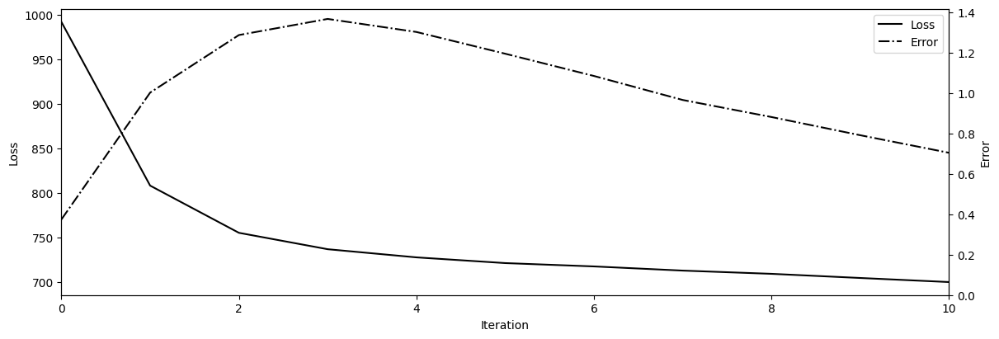

In [21]:
mogptk_model.train(method='Adam', lr=0.02, iters=10, plot=True, error='MSE', verbose=True);

## MOGP Prediction

### Capture predictions in dataframe

In [22]:
mogptk_time, mogptk_mu, mogptk_lower_ci, mogptk_upper_ci = mogptk_model.predict(
    X=None,
    ci=None,
    sigma=2,
    n=10000,
    transformed=False
)

In [23]:
mogptk_mu[0].shape

(216,)

In [24]:
mogptk_preds_df = pd.DataFrame(mogptk_mu,
                               index = arab_smooth.iloc[:, 1:].columns.tolist()).T
mogptk_preds_df.insert(0, 'time', arab_smooth['time'].values)
mogptk_preds_df

,time,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,0.000000,8.741306,3.451631,5.701566,6.811779,3.573250,6.297082,6.791690,7.620758,8.276685
1,0.271357,8.730289,3.362628,5.624904,6.835317,3.558729,6.292440,6.807785,7.628942,8.277294
2,0.542714,8.718301,3.282509,5.553130,6.853427,3.544310,6.287587,6.819895,7.636692,8.279501
3,0.814070,8.705733,3.211073,5.486602,6.866461,3.530308,6.282832,6.828511,7.643999,8.283178
4,1.085427,8.692960,3.147916,5.425534,6.874825,3.517015,6.278439,6.834185,7.650845,8.288136
...,...,...,...,...,...,...,...,...,...,...
211,51.990452,6.643351,6.470426,6.934399,6.995956,5.091795,4.507592,6.699786,7.549495,8.158042
212,52.236181,6.652968,6.380239,6.806429,6.919984,5.175107,4.530304,6.737682,7.535300,8.177169
213,52.507538,6.666551,6.275899,6.668251,6.831885,5.267852,4.556691,6.771608,7.518928,8.193585
214,52.778894,6.682888,6.166585,6.534517,6.739507,5.361216,4.584104,6.796622,7.501787,8.204598


### Modifying MOGPTK plot_prediction


Want to plot a square facet grid

In [25]:
def plot_prediction(mogptk_model,
                    X=None,
                    title=None,
                    figsize=None,
                    legend=True,
                    errorbars=True,
                    nrows = None,
                    ncols = None,
                    suptitle=None,
                    supfontsize=40,
                    subfontsize=20,
                    ci=None,
                    sigma=2,
                    n=10000,
                    transformed=False):
    """
    Plot the data including removed observations, latent function, and predictions of this model for each channel.

    Args:
        X (list, dict): Array of shape (data_points,), (data_points,input_dims), or [(data_points,)] * input_dims per channel with prediction X values. If a dictionary is passed, the index is the channel index or name.
        title (str): Set the title of the plot.
        figsize (tuple): Set the figure size.
        legend (boolean): Disable legend.
        errorbars (boolean): Plot data error bars if available.
        ci (float,list of float): Confidence interval as a percentage or the two quantile limits [lower, upper] in the range of [0,1].
        sigma (float): Number of standard deviations to display upwards and downwards.
        n (int): Number of samples used from distribution to estimate quantile.
        transformed (boolean): Display transformed Y data as used for training.

    Returns:
        matplotlib.figure.Figure: The figure.
        list of matplotlib.axes.Axes: List of axes.

    Examples:
        >>> fig, axes = dataset.plot(title='Title')
    """
    X, Mu, Lower, Upper = mogptk_model.predict(X, ci=ci, sigma=sigma, n=n, transformed=transformed)
    if len(mogptk_model.dataset) == 1:
        X = [X]
        Mu = [Mu]
        Lower = [Lower]
        Upper = [Upper]

    if figsize is None:
        figsize = (12,4*len(mogptk_model.dataset))

    if nrows == None and ncols == None:
        nrows = len(mogptk_model.dataset)
        ncols = 1

    fig, ax = plt.subplots(nrows = nrows,
                           ncols = ncols,
                           figsize=figsize,
                           squeeze=False,
                           constrained_layout=True)
    for j, data in enumerate(mogptk_model.dataset):
        r, c = divmod(j, ncols)

        # TODO: ability to plot conditional or marginal distribution to reduce input dims
        if data.get_input_dims() > 2:
            raise ValueError("cannot plot more than two input dimensions")
        if data.get_input_dims() == 2:
            raise NotImplementedError("two dimensional input data not yet implemented") # TODO

        legends = []
        if errorbars and data.Y_err is not None:
            x, y = data.get_train_data(transformed=transformed)
            yl = data.Y[data.mask] - data.Y_err[data.mask]
            yu = data.Y[data.mask] + data.Y_err[data.mask]
            if transformed:
                yl = data.Y_transformer.forward(yl, x)
                yu = data.Y_transformer.forward(yu, x)
            x = x.astype(data.X_dtypes[0])
            ax[j,0].errorbar(x, y, [y-yl, yu-y], elinewidth=1.5, ecolor='lightgray', capsize=0, ls='', marker='')

        # prediction
        idx = np.argsort(X[j][:,0])
        x = X[j][idx,0].astype(data.X_dtypes[0])
        ax[r, c].plot(x, Mu[j][idx], ls=':', color='blue', lw=2)
        if not np.all(Lower[j][idx] == Mu[j][idx]) and not np.all(Upper[j][idx] == Mu[j][idx]):
            ax[r, c].fill_between(x, Lower[j][idx], Upper[j][idx], color='blue', alpha=0.3)
            legends.append(patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='blue', alpha=0.3, lw=0, label='95% Error Bars'
            ))
        legends.append(plt.Line2D([0], [0], ls=':', color='blue', lw=2, label='Posterior Mean'))

        xmin = min(np.min(data.X), np.min(X[j]))
        xmax = max(np.max(data.X), np.max(X[j]))
        if data.F is not None:
            if np.issubdtype(data.X_dtypes[0], np.datetime64):
                dt = np.timedelta64(1,data.X.get_time_unit())
                n = int((xmax-xmin) / dt) + 1
                x = np.arange(xmin, xmax+np.timedelta64(1,'us'), dt, dtype=data.X_dtypes[0])
            else:
                n = len(data.X)*10
                x = np.linspace(xmin, xmax, n)

            y = data.F(x)
            if transformed:
                y = data.Y_transformer.forward(y, x)

            ax[r, c].plot(x, y, 'g--', lw=1)
            legends.append(plt.Line2D([0], [0], ls='--', color='g', label='Latent'))

        if data.has_test_data():
            x, y = data.get_test_data(transformed=transformed)
            x = x.astype(data.X_dtypes[0])
            ax[r, c].plot(x, y, 'r.', ms=10)
            legends.append(plt.Line2D([0], [0], ls='', color='r', marker='.', ms=10, label='Test data'))

        x, y = data.get_train_data(transformed=transformed)
        x = x.astype(data.X_dtypes[0])
        ax[r, c].plot(x, y, 'k.', ms=10)
        legends.append(plt.Line2D([0], [0], ls='', color='k', marker='.', ms=10, label='Train data'))

        if 0 < len(data.removed_ranges[0]):
            for removed_range in data.removed_ranges[0]:
                x0 = removed_range[0].astype(data.X_dtypes[0])
                x1 = removed_range[1].astype(data.X_dtypes[0])
                y0 = ax[r, c].get_ylim()[0]
                y1 = ax[r, c].get_ylim()[1]
                ax[r, c].add_patch(patches.Rectangle(
                    (x0, y0), x1-x0, y1-y0, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0,
                ))
            legends.insert(0, patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0, label='Removed Ranges'
            ))

        xmin = xmin.astype(data.X_dtypes[0])
        xmax = xmax.astype(data.X_dtypes[0])
        ax[r, c].set_xlim(xmin-(xmax-xmin)*0.001, xmax+(xmax-xmin)*0.001)
        ax[r, c].set_xlabel(data.X_labels[0])
        ax[r, c].set_ylabel(data.Y_label)
        ax[r, c].set_title(data.name if title is None else title, fontsize=subfontsize)

        ax[r, c].tick_params(axis='both', which='major', labelsize=24)
        ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


        # plt.legend(handles=legends[::-1])
    fig.supxlabel('Time (hours)', fontsize = 50)
    fig.supylabel('Microarray Readings', fontsize = 50)
    fig.suptitle(suptitle, fontsize=supfontsize)

    if legend:
      fig.legend(handles=legends[::-1], bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)
    return fig, ax

<ipython-input-26-fecb0d43f6f1>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_plant_q3_mosm.png"))
<ipython-input-26-fecb0d43f6f1>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_plant_q3_mosm.png"))
<ipython-input-26-fecb0d43f6f1>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_plant_q3_mosm.png"))
<ipython-input-26-fecb0d43f6f1>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer sup

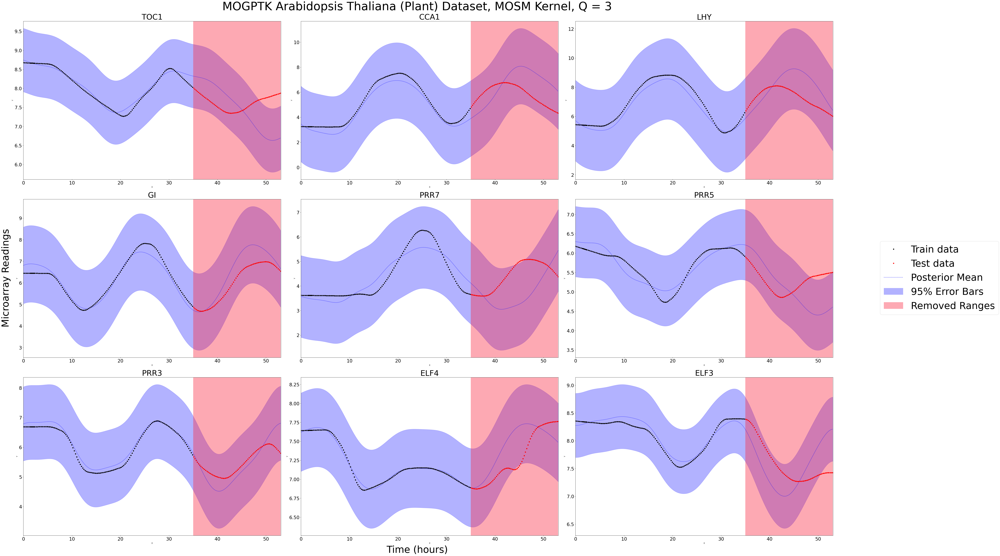

In [26]:
suptitle = 'MOGPTK Arabidopsis Thaliana (Plant) Dataset, MOSM Kernel, Q = 3'

plot_prediction(mogptk_model = mogptk_model,
                nrows = 3,
                ncols = 3,
                figsize = (60, 40),
                suptitle = suptitle,
                supfontsize=60,
                subfontsize= 40)

plt.savefig(os.path.join(plots_arab_path, "mogptk_plant_q3_mosm.png"))
plt.show()

In [ ]:
mogptk_model.print_parameters()

Name,Range,Value
MultiOutputSpectralMixtureKernel.weight,"[1e-08, ∞)",[[ 5.3180225 1.4895962 0.74439209 0.68307747] [19.35147302 3.41726599 2.61462026 2.32074096] [18.03898705 4.37306619 2.43379945 2.11736877] [11.21222564 2.76540305 1.72175902 1.55936979] [ 9.18043548 1.51973502 1.39900489 1.24542817] [ 5.64341931 1.18739401 0.93378604 0.7875932 ] [ 7.93536177 1.46339275 1.29487449 0.96708755] [ 2.59605698 2.44084419 0.65554998 0.62216639] [ 3.25245566 0.64490869 0.51517843 0.50327008]]
MultiOutputSpectralMixtureKernel.mean,"[1e-08, 3.6851851851851904]",[[[0.02942132] [0.06356148] [0.12927842] [0.08708269]] [[0.03679067] [0.11229697] [0.12015504] [0.16218437]] [[0.03721116] [0.08539204] [0.12803367] [0.16210108]] [[0.04257925] [0.08546555] [0.12973023] [0.14201227]] [[0.0277261 ] [0.12240617] [0.17376485] [0.20098036]] [[0.02958899] [0.10340362] [0.13024886] [0.16111159]] [[0.04027121] [0.08539152] [0.11136085] [0.16180081]] [[0.020213 ] [0.04505524] [0.08667031] [0.11330209]] [[0.04749286] [0.12387747] [0.16598819] [0.16069289]]]
MultiOutputSpectralMixtureKernel.variance,"[1e-08, ∞)",[[[1.16020629e-04] [1.16740886e-05] [4.69200392e-05] [9.38366780e-06]] [[1.23596349e-04] [2.67689642e-05] [2.21180183e-05] [1.63710495e-05]] [[1.08901330e-04] [3.25983034e-05] [3.40775873e-05] [1.29148539e-05]] [[1.27210010e-04] [4.08074671e-05] [3.87277215e-05] [3.04976636e-05]] [[2.05455122e-04] [9.66286552e-07] [3.78729312e-05] [1.72637776e-05]] [[1.26777385e-04] [2.12713007e-05] [2.23457887e-05] [3.27017533e-05]] [[1.28292597e-04] [7.62735875e-05] [3.26255625e-05] [2.06438963e-05]] [[7.58942986e-05] [3.81243917e-05] [2.14029807e-05] [4.27854095e-05]] [[2.09604320e-04] [5.98679531e-05] [5.35586103e-05] [4.23844080e-05]]]
MultiOutputSpectralMixtureKernel.delay,"(-∞, ∞)",[[[-7.66170892e-02] [ 9.60847397e-02] [ 2.32177680e-03] [ 9.05306909e-55]] [[ 1.20917244e-01] [ 1.57406619e-02] [ 1.45150575e-01] [ 8.10655804e-02]] [[ 1.39583072e-01] [-1.04756733e-01] [ 1.73605840e-01] [ 1.09472230e-01]] [[ 1.27350872e-01] [ 5.15757337e-03] [-4.75850238e-02] [-1.04724562e-01]] [[ 9.00301345e-02] [-1.30753262e-01] [-7.64929063e-02] [-7.55920274e-04]] [[-4.63870937e-02] [-1.02660109e-02] [-9.52997674e-03] [-3.97741587e-02]] [[-1.14392116e-01] [-1.69594576e-03] [-1.21867454e-01] [-5.75764450e-02]] [[ 1.94807887e-01] [ 4.21848157e-28] [-2.23425729e-51] [-5.44601535e-08]] [[-8.32985290e-02] [ 1.30754005e-01] [ 7.64929063e-02] [ 2.44721664e-02]]]
MultiOutputSpectralMixtureKernel.phase,"(-∞, ∞)",[[-8.53291620e-02 9.58064197e-02 3.37756606e-03 9.72121137e-54] [ 1.10188259e-01 1.30241602e-02 1.45059945e-01 8.12440114e-02] [ 1.50593720e-01 -1.04178065e-01 1.73220779e-01 1.08955085e-01] [ 1.34379764e-01 6.01362693e-03 -4.67871819e-02 -1.04825740e-01] [ 8.06387478e-02 -1.30570750e-01 -7.64881982e-02 -3.63242071e-03] [-4.46700013e-02 -7.36039102e-03 -8.30669403e-03 -3.93536539e-02] [-1.13609941e-01 -2.53769955e-03 -1.21712002e-01 -5.76531364e-02] [ 1.94816111e-01 7.06776794e-27 -2.31146294e-50 -3.77058711e-07] [-8.64157932e-02 1.30571599e-01 7.64881982e-02 3.14539286e-02]]
GaussianLikelihood.scale,"[1e-08, ∞)",[0.41760975 1.51225115 1.38474841 0.88884514 0.83419957 0.45509929 0.62535174 0.25845724 0.28876847]


## MOGP Covariance Matrix

In [27]:
# K = self.gpr.K(X).cpu().numpy()

# # normalise
# diag_sqrt = np.sqrt(np.diag(K))
# K /= np.outer(diag_sqrt, diag_sqrt)


output_dims = len(mogptk_model.dataset)
X_ = np.zeros((output_dims, 2))
X_[:,0] = np.arange(output_dims)
K = mogptk_model.gpr.K(X_).cpu().numpy()

# normalize
diag_sqrt = np.sqrt(np.diag(K))
K /= np.outer(diag_sqrt, diag_sqrt)

# Transform numpy array to dataframe
gene_cols = arab_smooth.iloc[:, 1:].columns.tolist()
mogptk_covariance_df = pd.DataFrame(K, index = gene_cols, columns = gene_cols)

mogptk_covariance_df

,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
TOC1,1.000000,2.924609e-02,3.418778e-03,2.776721e-04,0.428032,0.940457,7.979538e-03,-1.758591e-03,4.751066e-05
CCA1,0.029246,1.000000e+00,9.348436e-01,2.536474e-01,0.083395,0.073732,4.789713e-02,6.796127e-07,2.138777e-02
LHY,0.003419,9.348436e-01,1.000000e+00,3.004677e-01,0.052767,0.025173,-8.066631e-02,1.163489e-07,1.097443e-03
GI,0.000278,2.536474e-01,3.004677e-01,1.000000e+00,0.001347,0.010722,-1.333476e-02,1.418470e-11,6.011829e-02
PRR7,0.428032,8.339459e-02,5.276687e-02,1.347356e-03,1.000000,0.594683,2.802490e-03,6.790324e-02,-6.327567e-03
PRR5,0.940457,7.373169e-02,2.517273e-02,1.072228e-02,0.594683,1.000000,9.919199e-03,1.776778e-04,1.373368e-02
PRR3,0.007980,4.789713e-02,-8.066631e-02,-1.333476e-02,0.002802,0.009919,1.000000e+00,-7.558907e-10,2.053548e-01
ELF4,-0.001759,6.796127e-07,1.163489e-07,1.418470e-11,0.067903,0.000178,-7.558907e-10,1.000000e+00,-8.063804e-13
ELF3,0.000048,2.138777e-02,1.097443e-03,6.011829e-02,-0.006328,0.013734,2.053548e-01,-8.063804e-13,1.000000e+00


<ipython-input-28-9445381ac6d5>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_heatmap.png"))
<ipython-input-28-9445381ac6d5>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_heatmap.png"))
<ipython-input-28-9445381ac6d5>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_heatmap.png"))
<ipython-input-28-9445381ac6d5>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" wh

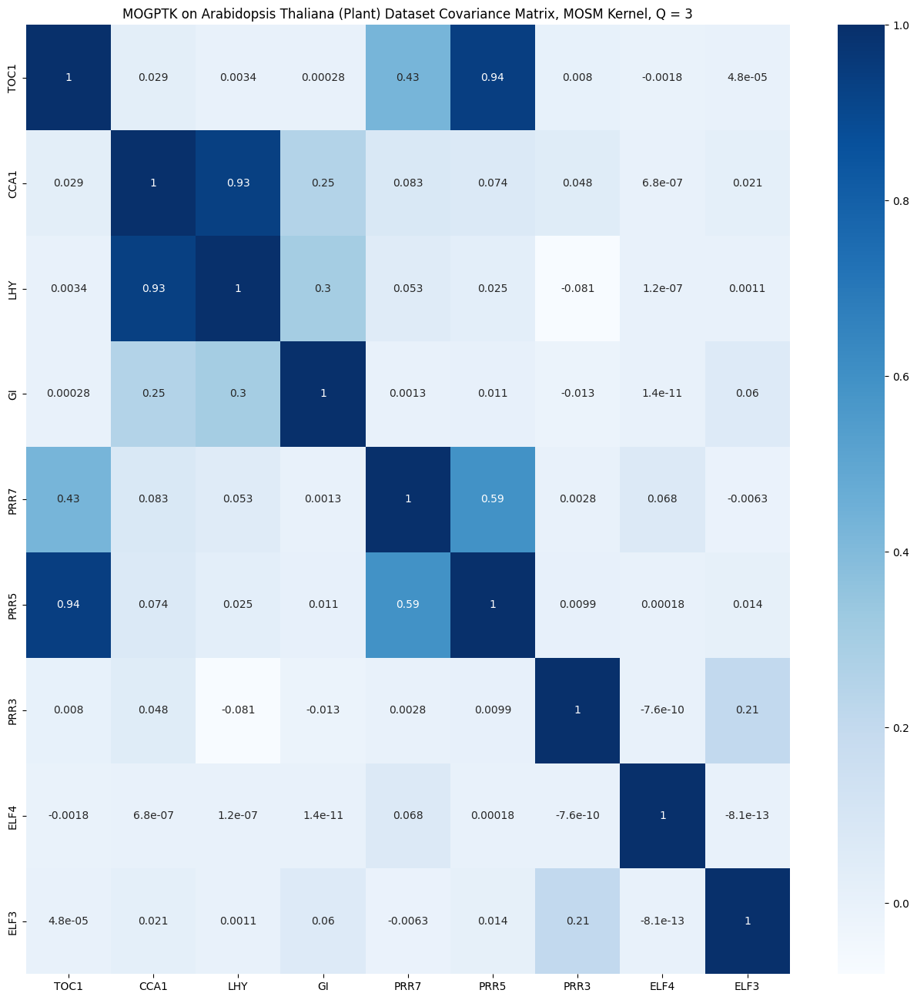

In [28]:
plt.figure(figsize=(16,16))
sns.heatmap(mogptk_covariance_df, cmap = 'Blues', annot = True,  xticklabels=True, yticklabels=True)
plt.title('MOGPTK on Arabidopsis Thaliana (Plant) Dataset Covariance Matrix, MOSM Kernel, Q = 3')
plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_heatmap.png"))


In [98]:
mogptk_model.print_parameters()

Name,Range,Value
MultiOutputSpectralMixtureKernel.weight,"[1e-08, ∞)",[[ 5.3054179 1.48956512 0.74399461] [19.35071805 3.42146868 2.61472635] [18.04271069 4.37318289 2.43515942] [11.21269578 2.7655269 1.72116894] [ 9.18096663 1.51956743 1.39962627] [ 5.64508762 1.18761928 0.9339857 ] [ 7.93700224 1.46400739 1.29490523] [ 2.5960926 2.44089861 0.65555492] [ 3.2524956 0.64498266 0.51512829]]
MultiOutputSpectralMixtureKernel.mean,"[1e-08, 3.6851851851851904]",[[[0.02943859] [0.0628341 ] [0.12426404]] [[0.03676524] [0.10138609] [0.1233544 ]] [[0.03718709] [0.08624506] [0.13028277]] [[0.04257703] [0.08543282] [0.13042164]] [[0.02777069] [0.1197211 ] [0.15831109]] [[0.02954374] [0.10121202] [0.13029349]] [[0.0403095 ] [0.0853289 ] [0.11090817]] [[0.02007158] [0.04441243] [0.08335301]] [[0.04751032] [0.10252756] [0.15823988]]]
MultiOutputSpectralMixtureKernel.variance,"[1e-08, ∞)",[[[1.16044502e-04] [1.16721280e-05] [4.67722786e-05]] [[1.23588937e-04] [2.68883071e-05] [2.21332050e-05]] [[1.08895731e-04] [3.26048187e-05] [3.40908436e-05]] [[1.27210570e-04] [4.09361406e-05] [3.85984183e-05]] [[2.05528620e-04] [9.66059196e-07] [3.79686813e-05]] [[1.26763192e-04] [2.13176806e-05] [2.22785510e-05]] [[1.28283817e-04] [7.61786512e-05] [3.26218553e-05]] [[7.59033279e-05] [3.81271148e-05] [2.14032632e-05]] [[2.09605293e-04] [5.98899825e-05] [5.35712851e-05]]]
MultiOutputSpectralMixtureKernel.delay,"(-∞, ∞)",[[[-7.66151116e-02] [ 9.87171868e-02] [-4.28903600e-02]] [[ 1.24833172e-01] [ 6.08148906e-02] [ 1.85908976e-01]] [[ 1.39151004e-01] [-1.14278385e-01] [ 1.88926160e-01]] [[ 1.27057124e-01] [-6.56228405e-03] [-7.46917440e-02]] [[ 8.90212120e-02] [-8.36941746e-02] [-1.50738612e-01]] [[-5.02409587e-02] [-3.86632435e-02] [-9.40876654e-03]] [[-1.14951294e-01] [ 1.81291086e-02] [-1.19244974e-01]] [[ 1.92574425e-01] [ 5.81760493e-28] [-1.08257202e-62]] [[-8.27568608e-02] [ 8.37671178e-03] [ 1.50738612e-01]]]
MultiOutputSpectralMixtureKernel.phase,"(-∞, ∞)",[[-8.48100670e-02 9.83958196e-02 -4.19275758e-02] [ 1.13740020e-01 6.00377712e-02 1.85873951e-01] [ 1.50067379e-01 -1.13748416e-01 1.88478374e-01] [ 1.34148879e-01 -5.30584759e-03 -7.44769311e-02] [ 7.93912912e-02 -8.37454739e-02 -1.50726313e-01] [-4.84207357e-02 -3.74446868e-02 -7.45529499e-03] [-1.14155163e-01 1.70930081e-02 -1.19097095e-01] [ 1.92875480e-01 9.85027376e-27 -1.14267231e-61] [-8.58379001e-02 8.67137443e-03 1.50726313e-01]]
GaussianLikelihood.scale,"[1e-08, ∞)",[0.41759933 1.51222749 1.38474054 0.88884721 0.83419898 0.45508521 0.62535294 0.25845792 0.28876828]


In [111]:
mogptk_model.Q

3

## MOGPTK Weight, Phase, Etc.

In [110]:
pd.DataFrame(mogptk_model.gpr.kernel.variance.cpu().detach().numpy()[:, :, 0])

,0,1,2
0,-113.642023,-136.617484,-122.730164
1,-113.012094,-128.267748,-130.214675
2,-114.277912,-126.339407,-125.893585
3,-112.723242,-124.063246,-124.651415
4,-107.925487,-161.630311,-124.815955
5,-112.758475,-130.590270,-130.149191
6,-112.639221,-117.851419,-126.334181
7,-117.887631,-124.774304,-130.550185
8,-107.729067,-120.257504,-121.372665


In [93]:
pd.DataFrame(mogptk_model.gpr.kernel.weight)

,0,1,2
0,5.305418,1.489565,0.743995
1,19.350718,3.421469,2.614726
2,18.042711,4.373183,2.435159
3,11.212696,2.765527,1.721169
4,9.180967,1.519567,1.399626
5,5.645088,1.187619,0.933986
6,7.937002,1.464007,1.294905
7,2.596093,2.440899,0.655555
8,3.252496,0.644983,0.515128


In [96]:
pd.DataFrame(mogptk_model.gpr.kernel.phase)

,0,1,2
0,-0.084810,9.839582e-02,-4.192758e-02
1,0.113740,6.003777e-02,1.858740e-01
2,0.150067,-1.137484e-01,1.884784e-01
3,0.134149,-5.305848e-03,-7.447693e-02
4,0.079391,-8.374547e-02,-1.507263e-01
5,-0.048421,-3.744469e-02,-7.455295e-03
6,-0.114155,1.709301e-02,-1.190971e-01
7,0.192875,9.850274e-27,-1.142672e-61
8,-0.085838,8.671374e-03,1.507263e-01


(<Figure size 1200x1200 with 81 Axes>,
 array([[<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>],
        [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
         <AxesSubplot:>, <Ax

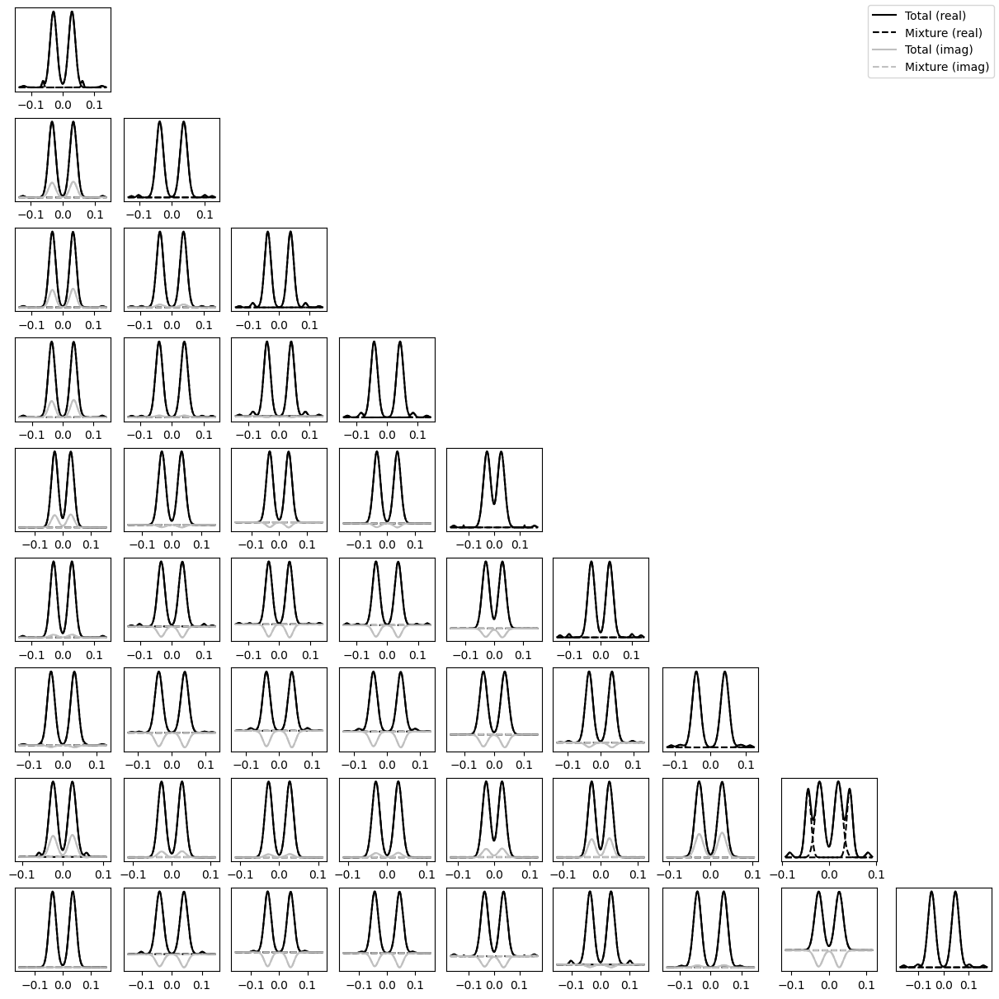

In [87]:
mogptk_model.plot_cross_spectrum()

## Visualizing Weights and Magnitude Per Q

In [113]:

input_dims = mogptk_model.dataset.get_input_dims()[0]
output_dims = mogptk_model.dataset.get_output_dims()
Q = mogptk_model.Q

cross_params = {}
cross_params['covariance'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['mean'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['magnitude'] = np.zeros((output_dims, output_dims, Q))
cross_params['delay'] = np.zeros((output_dims, output_dims, input_dims, Q))
cross_params['phase'] = np.zeros((output_dims, output_dims, Q))

weight = mogptk_model.gpr.kernel.weight.numpy()
mean = mogptk_model.gpr.kernel.mean.numpy()
variance = mogptk_model.gpr.kernel.variance.numpy()
phase = mogptk_model.gpr.kernel.phase.numpy()
delay = mogptk_model.gpr.kernel.delay.numpy()
for q in range(Q):
    for i in range(output_dims):
        for j in range(output_dims):
            w_i = weight[i,q]
            w_j = weight[j,q]
            mu_i = mean[i,q,:]
            mu_j = mean[j,q,:]
            var_i = variance[i,q,:]
            var_j = variance[j,q,:]
            sv = var_i + var_j

            cross_params['covariance'][i, j, :, q] = 2 * (var_i * var_j) / sv
            cross_mean_num = var_i.dot(mu_j) + var_j.dot(mu_i)
            cross_params['mean'][i, j, :, q] = cross_mean_num / sv
            exp_term = -1/4 * ((mu_i - mu_j)**2 / sv).sum()
            cross_params['magnitude'][i, j, q] = w_i * w_j * np.exp(exp_term)
            for k in range(input_dims):
                cross_params['delay'][i, j, k, q] = delay[i,q,k]-delay[j,q,k]
            cross_params['phase'][i, j, q] = phase[i,q]-phase[j,q]

<ipython-input-202-6150f78ae487>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_magnitude.png"))
<ipython-input-202-6150f78ae487>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_magnitude.png"))
<ipython-input-202-6150f78ae487>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_magnitude.png"))
<ipython-input-202-6150f78ae487>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_r

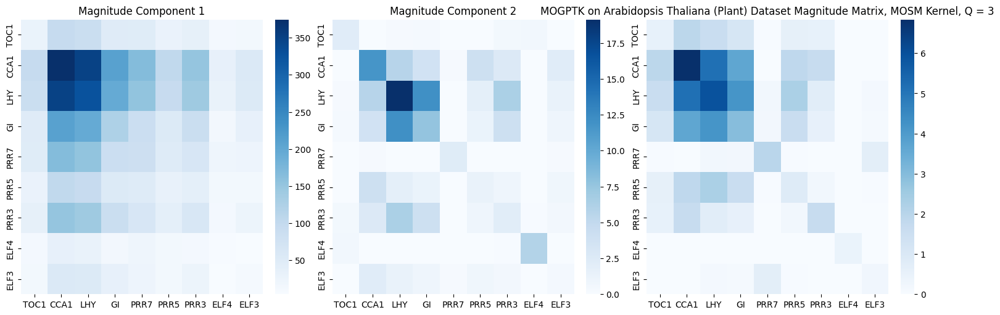

In [202]:
fig, ax = plt.subplots(1, Q, figsize=(15, 5), layout = "constrained")
for i in range(Q):
  sns.heatmap(pd.DataFrame(cross_params['magnitude'][:, :, i], columns=gene_cols, index=gene_cols), cmap = 'Blues', xticklabels=True, yticklabels=True, ax = ax[i])
  ax[i].set_title(f"Magnitude Component {i+1}")

plt.title('MOGPTK on Arabidopsis Thaliana (Plant) Dataset Magnitude Matrix, MOSM Kernel, Q = 3')
plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_magnitude.png"))

<ipython-input-201-b6d03ec54c4a>:13: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_covariance.png"))
<ipython-input-201-b6d03ec54c4a>:13: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_covariance.png"))
<ipython-input-201-b6d03ec54c4a>:13: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_covariance.png"))
<ipython-input-201-b6d03ec54c4a>:13: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_i

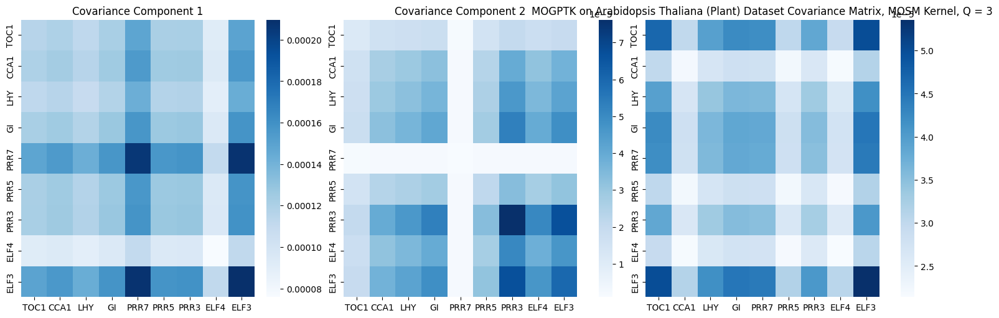

In [201]:
weights = dict()

for i in range(Q):
  weights[i] = cross_params['covariance'][:, :, 0, i]


fig, ax = plt.subplots(1, Q, figsize=(15, 5), layout = "constrained")
for i in range(Q):
  sns.heatmap(pd.DataFrame(weights[i], columns=gene_cols, index=gene_cols), cmap = 'Blues', xticklabels=True, yticklabels=True, ax = ax[i])
  ax[i].set_title(f"Covariance Component {i+1}")

plt.title('MOGPTK on Arabidopsis Thaliana (Plant) Dataset Covariance Matrix, MOSM Kernel, Q = 3')
plt.savefig(os.path.join(plots_arab_path, "mogptk_mosm_q3_plant_covariance.png"))

## MOGP Performance Metrics

In [220]:
mogptk_pooled_mse = pooled_mse(pred_df = mogptk_preds_df.iloc[:, 1:],
                                true_df = arab_smooth.iloc[:, 1:])
mogptk_r2 = r2_score(y_true = arab_smooth.iloc[:, 1:], y_pred = mogptk_preds_df.iloc[:, 1:])
mogptk_coupling = compare_coupling(pred_df = mogptk_covariance_df,
                 true_df = true_adjacency)

In [221]:
print(f"The Pooled MSE of the MOGPTK Model is {mogptk_pooled_mse}.")
print(f"The R^2 of the MOGPTK Model is {mogptk_r2}.")
print(f"The coupling accuracy is {mogptk_coupling}")

The Pooled MSE of the MOGPTK Model is 0.28019686807759453.
The R^2 of the MOGPTK Model is 0.5516144371653824.
The coupling accuracy is 12.767145334803704


# NCDE (Noise-Perturbed)

## NCDE Configs

In [144]:
# Data params
N_SNAPSHOTS = 5000 # number of observations
N_TIMEPOINTS = arab_smooth.shape[0] # number of datapoints

# Model params
HIDDEN_SIZE = 32
WIDTH_SIZE = 32 # The size of each hidden layer.
OUTPUT_SIZE = arab_smooth.shape[1] - 1 # output size, which here is the number of genes we want to output. # features = # genes = # columns in waves_df - 1 (because of time column)
DEPTH = 8
SEED = 12314
KEY = jr.PRNGKey(SEED)
train_data_key, test_data_key, model_key, loader_key = jr.split(KEY, 4)

add_noise = False
BATCH_SIZE = 32
lr = 1e-2
steps = 800

# Suppose we have lag-p auto-regressors
WINDOW_LENGTH = 4000
STEPSIZE = 10
NCDE_TRAIN_HIST_PROP = 0.8

## Helper Functions + Specify Model

In [145]:
# First, define the function which will specify the vector field of
# the differential equation.
class Func(eqx.Module):
    mlp: eqx.nn.MLP
    data_size: int
    hidden_size: int

    def __init__(self, data_size, hidden_size, width_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        self.data_size = data_size
        self.hidden_size = hidden_size
        self.mlp = eqx.nn.MLP(
            hidden_size,
            hidden_size * data_size,
            width_size,
            depth,
            activation=jnn.tanh,
            # Note the use of a tanh final activation function. This is important to
            # stop the model blowing up. (Just like how GRUs and LSTMs constrain the
            # rate of change of their hidden states.)
            final_activation=jnn.tanh,
            key=key,
        )

    def __call__(self, t, y, args):
        return self.mlp(y).reshape(self.hidden_size, self.data_size)

# The above Func will be solved as part of the NeuralCDE algo
# Below. Note we do have an MLP for the initial condition
# As well as the future iterations.

class NeuralCDE(eqx.Module):
    initial: eqx.nn.MLP
    func: Func
    linear: eqx.nn.Linear

    def __init__(self, data_size, hidden_size, width_size, output_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        ikey, fkey, lkey = jr.split(key, 3)
        self.initial = eqx.nn.MLP(in_size = data_size,
                                  out_size = hidden_size,
                                  width_size = width_size,
                                  depth = depth,
                                  key = ikey)
        self.func = Func(data_size, hidden_size, width_size, depth, key=fkey)
        self.linear = eqx.nn.Linear(hidden_size, output_size, key=lkey)

    def __call__(self, ts, coeffs, evolving_out=False):
        # Each sample of data consists of some timestamps `ts`, and some `coeffs`
        # parameterising a control path. These are used to produce a continuous-time
        # input path `control`.
        control = diffrax.CubicInterpolation(ts, coeffs) # X term
        print(f"Finished control with {control}")
        term = diffrax.ControlTerm(self.func, control).to_ode() # dXt term in NCDE
        solver = diffrax.Tsit5()
        dt0 = None
        y0 = self.initial(control.evaluate(ts[0]))

        print(f"ts[0] shape: {ts[0].shape}")
        print(f"y0 shape: {y0.shape}")

        if evolving_out:
            saveat = diffrax.SaveAt(ts=ts)
        else:
            saveat = diffrax.SaveAt(t1=True)
        solution = diffrax.diffeqsolve(
            term,
            solver,
            ts[0],
            ts[-1],
            dt0,
            y0,
            stepsize_controller=diffrax.PIDController(rtol=1e-3, atol=1e-6),
            saveat=saveat,
        )

        # return solution.ys, y0
        if evolving_out:
            # applies self.linear to every value of y (meaning at every timepoint)
            prediction = jax.vmap(lambda y: self.linear(y))(solution.ys) # jax.vmap(lambda y: jnn.tanh(self.linear(y)[0])(solution.ys)
        else:
            # print(f"solution.ys has shape {solution.ys.shape}")
            prediction = self.linear(solution.ys[-1]) # jnn.tanh(self.linear(solution.ys[-1])) # (prediction, )
        return prediction

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size

def window_stack(df, width=3, stepsize=1):
    """
    Takes in waves_df (T, G) dimension (T = # timepoints, G = # genes)
    and slides a window of length width (W), sliding over on stepsize at a time,
    to return two datasets:

    1. Jax array of feature vectors, size (T - W, G, W)
    2. Jax array of target vectors, size (T - W, G, 1)
    """

    dat = df.drop(labels = 'time', axis = 1) # remove time column
    dat = dat.T # transpose from [time, genes] to [genes, time]
    dat = dat.values # only gets values, which will make us lose gene index
    max_T = dat.shape[1] # number of timepoints
    range_T = df.time.to_list() # store all timepoints in a list

    # Create windowed Jax array for features (technically autoregressors)
    feat_window_list = [dat[:, k: (k + width)] for k in range(0, max_T - width, stepsize)]
    feat_window_jnp = jnp.array(feat_window_list) # turns this into a Jax array of size [T - W, G, W]
    feat_window_jnp = jnp.moveaxis(feat_window_jnp, -1, -2) # transposes last two axis so we get [T - W, W, G]

    # Prep timepoints to be stacked with the features, as this is a requirement for the diffrax training method
    time_window_jnp = jnp.array([range_T[k:k + width] for k in range(0, max_T - width, stepsize)]) # size [T - W, W]
    time_windowed = jnp.expand_dims(time_window_jnp, -1) # to [T - W, W, 1]

    # Concatenate (T - W, W, G) tensor of features with (T - W, W, 1) tensor of time to get a (T - W, W, G + 1) tensor of features + time
    x_windowed = jnp.concatenate([time_windowed, feat_window_jnp], axis = -1)

    # Create windowed Jax array for target (= response) variables
    target_window_list = [dat[:, k + width] for k in range(0, max_T - width, stepsize)]
    target_window_jnp = jnp.array(target_window_list) # turns into a Jax array of size [T - W, G]
    y_windowed = jnp.expand_dims(target_window_jnp, -2) # makes it same dimensionality as feat_window_jnp, i.e., [T - W, G] to [T - W, 1, G]

    return x_windowed, y_windowed, time_windowed

# Modeling Functions
def train_test_split(X, y, t, pct_hist):
    max_T = X.shape[0]
    hist_cutoff = int(max_T * pct_hist)

    X_hist, y_hist, t_hist = X[:hist_cutoff, :, :], y[:hist_cutoff, :, :], t[:hist_cutoff, :, :]
    X_future, y_future, t_future = X[hist_cutoff:, :, :], y[hist_cutoff:, :, :], t[hist_cutoff:, :, :]

    return X_hist, y_hist, t_hist, X_future, y_future, t_future


def cubic_spline_interpolation(X_stack, t_stack):
    # Do cubic spline interpolation to get X
    if t_stack.ndim == 3:
        t_stack = t_stack[:, :, 0]

    coeffs = jax.vmap(diffrax.backward_hermite_coefficients)(t_stack, X_stack)

    return coeffs

## Data Transformations for Training

In [146]:
dinner_noise_iter = []

for i in range(N_SNAPSHOTS):
  dinner_wo_time = arab_smooth.iloc[:, 1:] # shape :  (n_timepoints, n_genes)
  noise = np.random.normal(0, 0.001, dinner_wo_time.shape)
  dinner_wo_time = dinner_wo_time + noise # (n_timepoints, n_genes + 1)

  dinner_noise_iter.append(dinner_wo_time)

dinner_noise_iter = np.stack(dinner_noise_iter) # (n_shapshots, n_timepoints, n_genes + 1)

dinner_noise_iter.shape

(5000, 216, 9)

In [147]:
# Get a 1D vector of timepoints from the dataset
t_vec = arab_smooth['time'].values.reshape(-1, 1)
print(f"Shape of t_vec: {t_vec.shape}")
# repeat over N_SNAPSHOTS rows to prep for the NCDE training format
t_mat = np.tile(t_vec, (N_SNAPSHOTS, 1, 1))
print(f"Shape of t_mat: {t_mat.shape}")
# Prep it for training by removing the third dimension and remove last timepoint to fit training X_waveforms later
t_mat2d = t_mat[:, :N_TIMEPOINTS - 1, 0]
print(f"Shape of the t_mat2d is currently {t_mat2d.shape}.")

# Concatenate training data with timestamps to create waveforms_all
waveforms_all = jnp.concatenate([t_mat, dinner_noise_iter], axis = -1)
print(f"Shape of the waveforms_all is currently {waveforms_all.shape}")

# Split data into X and y
X_waveforms = waveforms_all[:, :N_TIMEPOINTS - 1, :]
y_waveforms = dinner_noise_iter[:, N_TIMEPOINTS - 1:, :]
y_waveforms_evol = dinner_noise_iter[:, :N_TIMEPOINTS - 1, :]
print(f"Created X_waveforms with shape {X_waveforms.shape} and y_waveforms with shape {y_waveforms.shape}.")

# Create cubic spline over X
coeffs = cubic_spline_interpolation(X_waveforms, t_mat2d)
print(f"Length of the coefficients is currently {len(coeffs)} with each element having shape {coeffs[0].shape}.")


Shape of t_vec: (216, 1)
Shape of t_mat: (5000, 216, 1)
Shape of the t_mat2d is currently (5000, 215).
Shape of the waveforms_all is currently (5000, 216, 10)
Created X_waveforms with shape (5000, 215, 10) and y_waveforms with shape (5000, 1, 9).
Length of the coefficients is currently 4 with each element having shape (5000, 214, 10).


## Train NCDE Model

### Run: 4/13/2025 7:04 PM, 500 steps, Depth = 4 (2x)

Finished control with CubicInterpolation(
  ts=f32[215], coeffs=[f32[214,10], f32[214,10], f32[214,10], f32[214,10]]
)
ts[0] shape: ()
y0 shape: (32,)
y_true: (32, 215, 9); y_pred: (32, 215, 9).
Step: 0, Loss: 43.01304244995117, Accuracy: 43.01304244995117, Computation time: 14.8150475025177
Step: 1, Loss: 42.61978530883789, Accuracy: 42.61978530883789, Computation time: 0.8879458904266357
Step: 2, Loss: 42.22874069213867, Accuracy: 42.22874069213867, Computation time: 0.8716268539428711
Step: 3, Loss: 41.83518600463867, Accuracy: 41.83518600463867, Computation time: 0.8431086540222168
Step: 4, Loss: 41.4486083984375, Accuracy: 41.4486083984375, Computation time: 0.830817461013794
Step: 5, Loss: 41.07183074951172, Accuracy: 41.07183074951172, Computation time: 0.7988338470458984
Step: 6, Loss: 40.69418716430664, Accuracy: 40.69418716430664, Computation time: 0.8471825122833252
Step: 7, Loss: 40.3106689453125, Accuracy: 40.3106689453125, Computation time: 0.8126943111419678
Step: 8, Los

<ipython-input-148-57e480f73962>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "neural_plant_cde_w32_800.png"))
<ipython-input-148-57e480f73962>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "neural_plant_cde_w32_800.png"))
<ipython-input-148-57e480f73962>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "neural_plant_cde_w32_800.png"))
<ipython-input-148-57e480f73962>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" wh

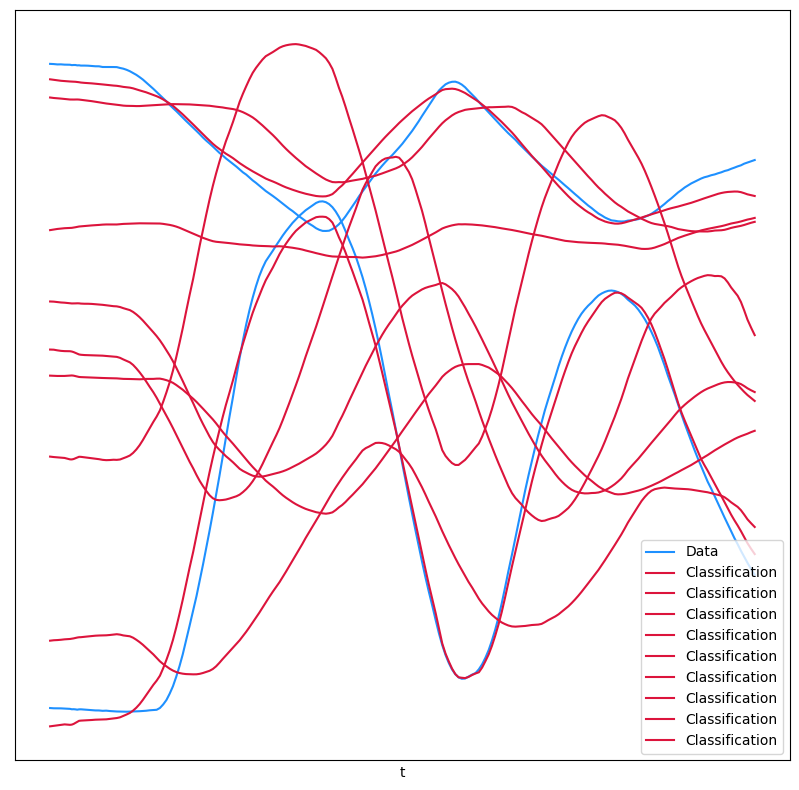

In [148]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig(os.path.join(plots_arab_path, "neural_plant_cde_w32_800.png"))
plt.show()

## Plot Predictions

Finished control with CubicInterpolation(
  ts=f64[215](numpy),
  coeffs=(f32[214,10], f32[214,10], f32[214,10], f32[214,10])
)
ts[0] shape: ()
y0 shape: (32,)


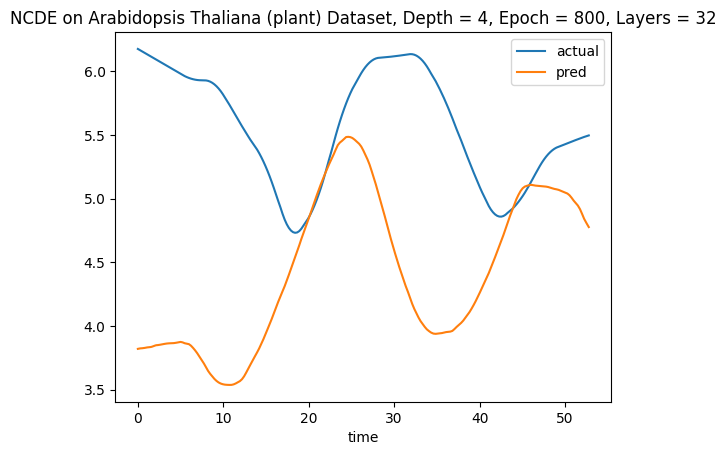

In [149]:
ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

samp_idx = 5
colname = arab_smooth.iloc[:, 1:].columns.tolist()[samp_idx]

actual_data = arab_smooth.iloc[:-1, :].loc[:, colname].values
pred_data = ncde_pred_df[:, samp_idx - 1]

sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

# Plot
sample_pred_df.plot(x = 't')
plt.xlabel('time')
plt.title('NCDE on Arabidopsis Thaliana (plant) Dataset, Depth = 4, Epoch = 800, Layers = 32')
plt.show()

Finished control with CubicInterpolation(
  ts=f64[215](numpy),
  coeffs=(f32[214,10], f32[214,10], f32[214,10], f32[214,10])
)
ts[0] shape: ()
y0 shape: (32,)


<ipython-input-151-73194cb9d74d>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'ncde_plant_d4_ep500_l32.png'))
<ipython-input-151-73194cb9d74d>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'ncde_plant_d4_ep500_l32.png'))
<ipython-input-151-73194cb9d74d>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'ncde_plant_d4_ep500_l32.png'))
<ipython-input-151-73194cb9d74d>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is 

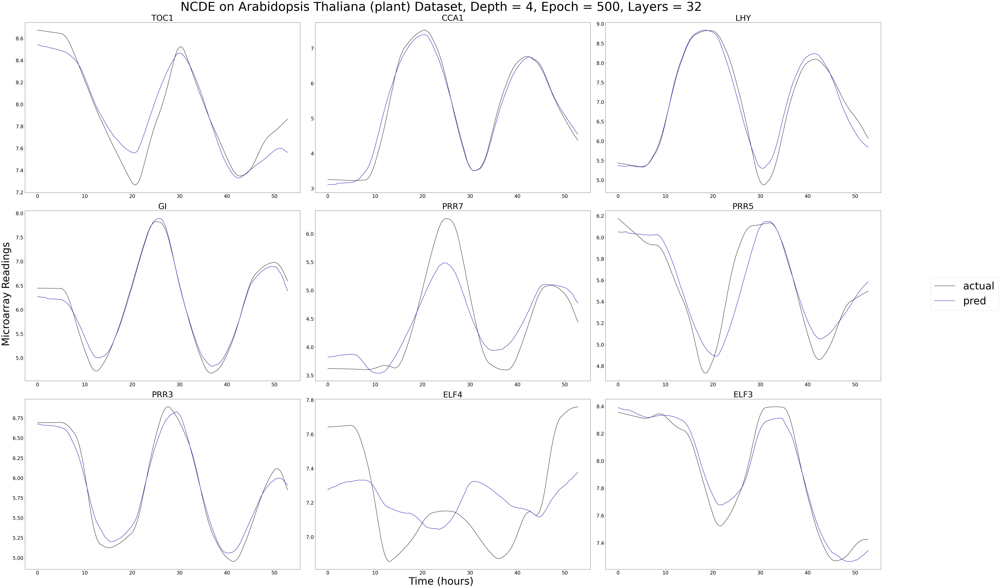

In [151]:
gene_cols = arab_smooth.iloc[:, 1:].columns.tolist()

ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)
ncde_pred_df = pd.DataFrame(ncde_pred_df, columns = gene_cols)

fig, ax = plt.subplots(3, 3, figsize = (60, 40), layout="constrained")

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 3)

  colname = gene_cols[col]

  actual_data = arab_smooth.iloc[:-1, :].loc[:, colname].values
  pred_data = ncde_pred_df[colname].values

  sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
  sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['actual'].values,
                label = 'actual',
                color = 'black')
  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['pred'].values,
                label = 'pred',
                color = 'blue')
  ax[r, c].set_title(colname, fontsize = 40)
  ax[r, c].tick_params(axis='both', which='major', labelsize=24)
  ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('Microarray Readings', fontsize = 50)

handles, labels = ax[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

suptitle_ncde = 'NCDE on Arabidopsis Thaliana (plant) Dataset, Depth = 4, Epoch = 500, Layers = 32'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_arab_path, 'ncde_plant_d4_ep500_l32.png'))
plt.show()

## Performance Metrics

### Pooled MSE

In [157]:
ncde_pooled_mse = pooled_mse(ncde_pred_df, arab_smooth.iloc[:-1, 1:])

### R2

In [154]:
ncde_r2 = r2_score(y_true = arab_smooth.iloc[:-1, 1:], y_pred = ncde_pred_df)

In [158]:
print(f"Pooled MSE: {ncde_pooled_mse}")
print(f"R2: {ncde_r2}")

Pooled MSE: 0.03724735130212411
R2: 0.8576283730095291


# Koopman

## Koopman Configs

In [151]:
arab_smooth.iloc[0, 1:]

,0
TOC1,8.674295
CCA1,3.254499
LHY,5.438053
GI,6.446412
PRR7,3.621461
PRR5,6.176346
PRR3,6.690822
ELF4,7.641649
ELF3,8.355742


In [152]:
# Data params
N_SNAPSHOTS = 1000 # number of observations
N_TIMEPOINTS = arab_smooth.shape[0] # number of datapoints
DT = 1
X0_koop = arab_smooth.iloc[0, 1:].values # gets first row (0) and all columns except time (1:)
time_vec = arab_smooth['time'].values

In [115]:
X0_koop.shape

(9,)

## Data Transformations for Training

In [166]:
dinner_noise_iter = []

X_edmds = []
Y_edmds = []

for i in range(N_SNAPSHOTS):
  # Get all waveforms without the time column
  tempo_wo_time = arab_smooth.iloc[:, 1:] # shape :  (n_timepoints, n_genes)

  # Add noise
  noise = np.random.normal(0, 0.01, tempo_wo_time.shape)
  tempo_wo_time = tempo_wo_time + noise # (n_timepoints, n_genes)

  # Shape: (n_timepoints - 1, n_genes)
  X_edmd = tempo_wo_time.iloc[:-1, :]
  Y_edmd = tempo_wo_time.iloc[1:, :]

  X_edmds.append(X_edmd)
  Y_edmds.append(Y_edmd)

# Shape: ((n_timepoints - 1) * N_SNAPSHOTS, n_genes)
X_edmds = np.vstack(X_edmds)
Y_edmds = np.vstack(Y_edmds)

Xkoop_test = arab_smooth.iloc[:, 1:].values

  # dinner_noise_iter.append(dinner_wo_time)

# dinner_noise_iter = np.concatenate(dinner_noise_iter, axis = 0) # (n_shapshots * n_timepoints, n_genes)

In [167]:
tempo_wo_time

,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,8.676015,3.254104,5.442146,6.442396,3.606115,6.185003,6.682206,7.647521,8.366649
1,8.677308,3.246931,5.425013,6.451095,3.615356,6.169259,6.686481,7.630666,8.347065
2,8.680481,3.243937,5.422652,6.453372,3.629902,6.181077,6.690257,7.647398,8.346055
3,8.671983,3.258661,5.416689,6.438714,3.615588,6.140461,6.709124,7.636889,8.338095
4,8.659206,3.245330,5.422033,6.433231,3.636780,6.145184,6.705267,7.647744,8.362554
...,...,...,...,...,...,...,...,...,...
211,7.824045,4.532179,6.232117,6.759076,4.634295,5.484017,5.971988,7.756586,7.431986
212,7.862491,4.474016,6.160567,6.709046,4.541952,5.469281,5.946106,7.772258,7.452151
213,7.860272,4.402913,6.119871,6.650154,4.513453,5.488295,5.892798,7.745256,7.421065
214,7.861680,4.381464,6.067490,6.600895,4.432927,5.512742,5.851974,7.784909,7.430129


In [168]:
Y_edmds.shape

(215000, 9)

In [169]:
Xtest = arab_smooth.iloc[:, 1:].values
Xtest.shape

(216, 9)

## Koopman Training

### EDMD Fit

In [195]:
?pk.regression.EDMD

In [196]:
## Training
degree = 2

regr = pk.regression.EDMD()
obsv = pk.observables.Polynomial(degree=degree)
# obsv = pk.observables.RandomFourierFeatures()

model_dmd = pk.Koopman(observables=obsv, regressor=regr)


In [197]:
# Takes a lot of RAM to run
model_dmd.fit(X_edmds, y=Y_edmds, dt=DT)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The att

Koopman(observables=Polynomial(), regressor=EDMD())

### DMD Fit

In [209]:
rank = 12

dmd = DMD(svd_rank=rank)

model_dmd = pk.Koopman(regressor=dmd)
model_dmd.fit(X_edmd.values, Y_edmd.values)
model_dmd.time['dt']=time_vec[1] - time_vec[0]

### DMD Simulate (Predict)

In [210]:
koopman_pred_df = model_dmd.simulate(x0 = X0_koop, n_steps = len(time_vec))
koopman_pred_df = pd.DataFrame(koopman_pred_df, columns = arab_smooth.iloc[:, 1:].columns.tolist())

/usr/local/lib/python3.11/dist-packages/pykoopman/koopman.py:292: ComplexWarning: Casting complex values to real discards the imaginary part
  x = x.astype(self.A.dtype)


## Plot DMD Simulation

<ipython-input-211-5f2e3605d4f5>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, f'dmd_plant_EDMD_dmd_rank{rank}.png'))
<ipython-input-211-5f2e3605d4f5>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, f'dmd_plant_EDMD_dmd_rank{rank}.png'))
<ipython-input-211-5f2e3605d4f5>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, f'dmd_plant_EDMD_dmd_rank{rank}.png'))
<ipython-input-211-5f2e3605d4f5>:38: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inch

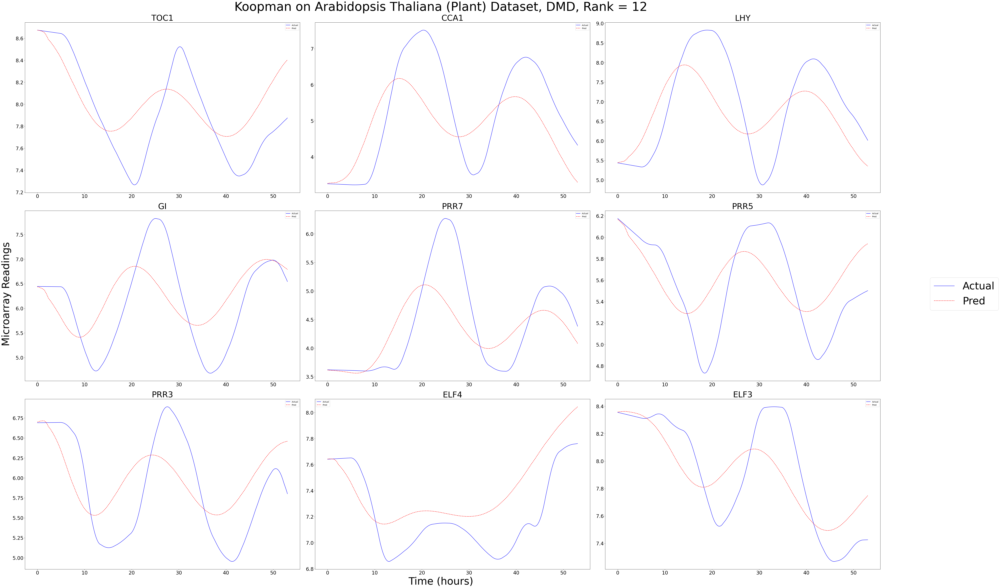

In [211]:
fig, axs = plt.subplots(3, 3,
                        figsize=(60, 40), layout = "constrained")

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

gene_cols = arab_smooth.iloc[:, 1:].columns.tolist()

for col in range(koopman_pred_df.shape[1]):
  r, c = divmod(col, 3)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:Xmin],
                 Xkoop_test[:Xmin, col],
                 '-',
                 color='b',
                 label='Actual')
  axs[r, c].plot(time_vec[:Xmin],
                 koopman_pred_df.iloc[:Xmin, :].loc[:, colname].values,
                 '--r',
                 label='Pred')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)


# Plot
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('Microarray Readings', fontsize = 50)

suptitle_ncde = f'Koopman on Arabidopsis Thaliana (Plant) Dataset, DMD, Rank = {rank}'
plt.suptitle(suptitle_ncde, fontsize = 60)

plt.savefig(os.path.join(plots_arab_path, f'dmd_plant_EDMD_dmd_rank{rank}.png'))
plt.show()

In [222]:
koopman_pred_df.iloc[:Xmin, 0]

,TOC1
0,8.673802
1,8.672392
2,8.670028
3,8.666683
4,8.662335
...,...
211,8.350610
212,8.364956
213,8.378783
214,8.392072


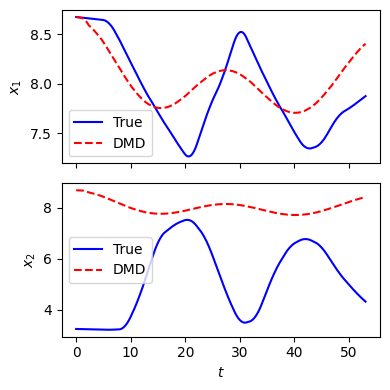

In [223]:
fig, axs = plt.subplots(2, 1, sharex=True, tight_layout=True, figsize=(4, 4))

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

axs[0].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 0], '-', color='b', label='True')
axs[0].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[0].set(ylabel=r'$x_1$')
axs[1].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 1], '-', color='b', label='True')
axs[1].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[1].set(
        ylabel=r'$x_2$',
        xlabel=r'$t$')
for i in range(2):
    axs[i].legend(loc='best')

## Eigenvectors

In [225]:
koop_lv_eigenvals = np.log(np.linalg.eig(model_dmd.A)[0])/DT

print(f"koopman eigenvalues = {koop_lv_eigenvals}")

koopman eigenvalues = [-3.05661132e-02+0.10491159j -3.05661132e-02-0.10491159j
  1.44929856e-04+0.j          5.09675770e-05+0.01383409j
  5.09675770e-05-0.01383409j -3.01330337e-03+0.05778999j
 -3.01330337e-03-0.05778999j -2.86660143e-02+0.05628624j
 -2.86660143e-02-0.05628624j]


In [227]:
for eigval in model_dmd.continuous_lamda_array:
    print('continuous eigenvalue = ',eigval)


continuous eigenvalue =  (-0.1126417877171553+0.3866186348945334j)
continuous eigenvalue =  (-0.1126417877171553-0.3866186348945334j)
continuous eigenvalue =  (0.0005340933565408187+0j)
continuous eigenvalue =  (0.00018782495984351617+0.05098119153647451j)
continuous eigenvalue =  (0.00018782495984351617-0.05098119153647451j)
continuous eigenvalue =  (-0.011104580926569024+0.21296679977415714j)
continuous eigenvalue =  (-0.011104580926569024-0.21296679977415714j)
continuous eigenvalue =  (-0.10563957106300076+0.207425208596995j)
continuous eigenvalue =  (-0.10563957106300076-0.207425208596995j)


<AxesSubplot:>

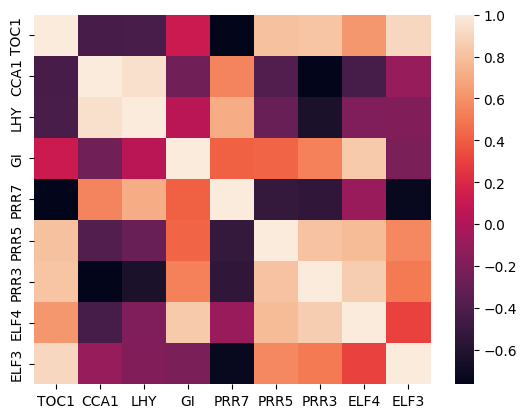

In [228]:
modes_real_df = pd.DataFrame(model_dmd.W.real)
modes_real_corr = modes_real_df.T.corr()
modes_real_corr.index = arab_smooth.iloc[:, 1:].columns.tolist()
modes_real_corr.columns = arab_smooth.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_real_corr)

<AxesSubplot:>

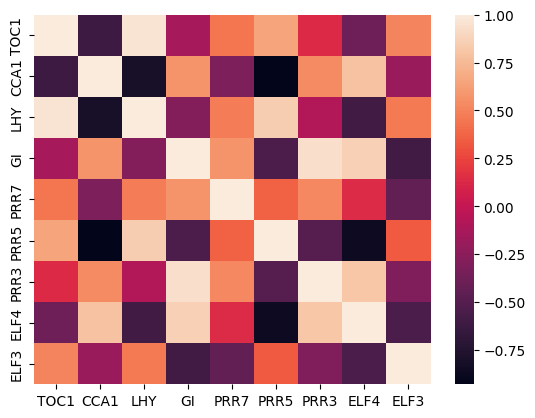

In [229]:
modes_imag_df = pd.DataFrame(model_dmd.W.imag)
modes_imag_corr = modes_imag_df.T.corr()
modes_imag_corr.index = arab_smooth.iloc[:, 1:].columns.tolist()
modes_imag_corr.columns = arab_smooth.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_imag_corr)

In [230]:
def manual_covariance(x):
    mean = x.mean(axis=1)
    print(x.shape[1])
    cov = np.zeros((len(x), len(x)), dtype='complex64')

    for i in range(len(mean)):
        for k in range(len(mean)):
            s = 0
            for j in range(len(x[1])):  # 5 Col
                s += np.dot((x[i,j] - mean[i]), np.conj(x[k,j] - mean[i]))
            cov[i, k] = s / ((x.shape[1]) - 1)
    return cov

9


<ipython-input-231-aafe77deb478>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'dmd_plant_edmd_poly2.png'))
<ipython-input-231-aafe77deb478>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'dmd_plant_edmd_poly2.png'))
<ipython-input-231-aafe77deb478>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'dmd_plant_edmd_poly2.png'))
<ipython-input-231-aafe77deb478>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer

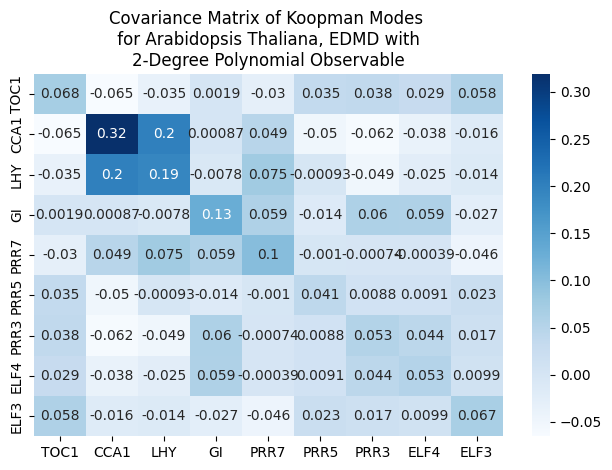

In [231]:
modes_both_df = pd.DataFrame(manual_covariance(model_dmd.W).real.round(5),
                            index = arab_smooth.iloc[:, 1:].columns.tolist(),
                            columns = arab_smooth.iloc[:, 1:].columns.tolist()
                            )

sns.heatmap(modes_both_df,
            cmap = 'Blues',
            annot=True, xticklabels=True, yticklabels=True)
plt.title("Covariance Matrix of Koopman Modes \n" +
          " for Arabidopsis Thaliana, EDMD with \n2-Degree Polynomial Observable")
plt.savefig(os.path.join(plots_arab_path, 'dmd_plant_edmd_poly2.png'))
plt.tight_layout()
plt.show()

## Koopman / DMD Performance Metrics

In [233]:
koopman_pooled_mse = pooled_mse(true_df = arab_smooth.iloc[:, 1:], pred_df = koopman_pred_df)
koopman_pooled_r2 = r2_score(y_true = arab_smooth.iloc[:, 1:], y_pred = koopman_pred_df)
koop_coupling = compare_coupling(pred_df = modes_both_df,
                                 true_df = true_adjacency)

In [234]:
print(f"Pooled MSE: {koopman_pooled_mse}")
print(f"R2: {koopman_pooled_r2}")
print(f"Coupling Degree: {koop_coupling}")

Pooled MSE: 0.4100490388168507
R2: 0.40249605280903616
Coupling Degree: 9.1104335791443


# Bayesian Lotka-Volterra

## Helper Functions

In [239]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]
    B = theta[3, :]

    return odeint(func=gLV, y0=X0,
                  t=arab_smooth.time,
                  args=(r, AX, B))



def gLV(X, t, r, AX, B):
    return X * (r + AX) + B

## Specify Model

In [240]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = arab_smooth.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=0,
                    upper=12,
                    shape=n,
                    initval=arab_smooth.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Normal("r",
                  mu=0,
                  sigma=5,
                  shape=n)
    priors.append(r)


    # Params for A
    A = pm.Normal("A",
                  mu=0,
                  sigma=5,
                  shape=(n, n),
                  initval=arab_smooth.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Params for linear term B
    B = pm.Normal("B",
                  mu=0,
                  sigma=5,
                  shape=n)
    priors.append(B)

    # Priors
    sigma = pm.HalfNormal("sigma", 5)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=arab_smooth.iloc[:, 1:].values)

## Sampling

In [241]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    trace_slice = pm.sample(step=[pm.Metropolis(vars_list)],
                            tune = tune,
                            draws = draws,
                            progressbar = True)

trace = trace_slice
az_trace = az.summary(trace)
az_trace

Output()

<ipython-input-239-da082c2e38a4>:18: RuntimeWarning: overflow encountered in multiply
  return X * (r + AX) + B
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
<ipython-input-239-da082c2e38a4>:18: RuntimeWarning: overflow encountered in multiply
  return X * (r + AX) + B
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
<ipython-input-239-da082c2e38a4>:18: RuntimeWarning: overflow encountered in multiply
  return X * (r + AX) + B
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warn

/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/usr/local/lib/python3.11/dist-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"A[0, 0]",0.198,0.0,0.198,0.198,0.0,0.0,400.0,400.0,NaN
"A[0, 1]",-0.615,0.0,-0.615,-0.615,0.0,NaN,400.0,400.0,NaN
"A[0, 2]",-0.497,0.0,-0.497,-0.497,0.0,0.0,400.0,400.0,NaN
"A[0, 3]",0.006,0.0,0.006,0.006,0.0,0.0,400.0,400.0,NaN
"A[0, 4]",-0.144,0.0,-0.144,-0.144,0.0,0.0,400.0,400.0,NaN
...,...,...,...,...,...,...,...,...,...
r[5],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[6],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[7],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN
r[8],0.000,0.0,0.000,0.000,0.0,NaN,400.0,400.0,NaN


In [242]:
model.values_to_rvs.keys()

dict_keys([X0_interval__, r, A, B, sigma_log__, TensorConstant(TensorType(float64, shape=(216, 9)), data=array([[8. ... 2646973]]))])

## Model 2

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]

    return odeint(func=gLV, y0=X0,
                  t=arab_smooth.time,
                  args=(r, AX))



def gLV(X, t, r, AX):
    return X * (r + AX)

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = arab_smooth.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=0,
                    upper=12,
                    shape=n,
                    initval=arab_smooth.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Uniform("r",
                  lower=0,
                  upper=12,
                  shape=n,
                  initval=arab_smooth.iloc[1, 1:].values)
    priors.append(r)


    # Params for A
    # A = pm.Normal("A",
    #               mu=0,
    #               sigma=5,
    #               shape=(n, n),
    #               initval=dinner_smooth.iloc[:, 1:].cov().values)
    A = pm.Uniform("A", lower = -5, upper = 5, shape = (n, n),
                   initval = arab_smooth.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Priors
    sigma = pm.HalfNormal("sigma", 10)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=arab_smooth.iloc[:, 1:].values)

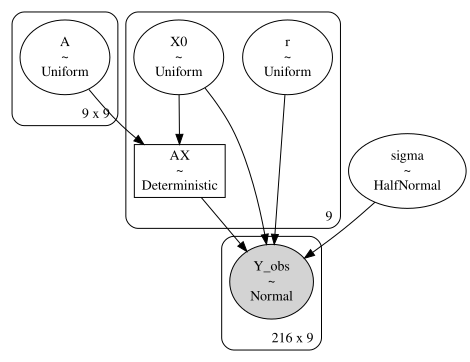

In [ ]:
pm.model_to_graphviz(model=model)


In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    nuts_trace_slice = pm.sample(progressbar = False)

nuts_trace = nuts_trace_slice
az_nuts_trace = az.summary(nuts_trace)
az_nuts_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
<ipython-input-275-b695c00ec3c5>:17: RuntimeWarning: overflow encountered in multiply
  return X * (r + AX)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
<ipython-input-275-b695c00ec3c5>:17: RuntimeWarning: overflow encountered in multiply
  return X * (r + AX)
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarn

ParallelSamplingError: Chain 0 failed with: Bad initial energy: SamplerWarning(kind=<WarningType.BAD_ENERGY: 8>, message='Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:\n[-inf]\n.Try model.debug() to identify parametrization problems.', level='critical', step=0, exec_info=None, extra=None, divergence_point_source=None, divergence_point_dest=None, divergence_info=None)

## Evaluate Performance

## Get Posterior Params

In [245]:
A_mh = az_trace.loc[az_trace['mean'].index.str.startswith('A['), 'mean'].values.reshape((n, n))
X0_mh = az_trace.loc[az_trace['mean'].index.str.startswith('X0'), 'mean'].values
r_mh = az_trace.loc[az_trace['mean'].index.str.startswith('r'), 'mean'].values
B_mh = az_trace.loc[az_trace['mean'].index.str.startswith('B'), 'mean'].values

A_mh_df = pd.DataFrame(A_mh,
                       columns = arab_smooth.columns[1:],
                       index = arab_smooth.columns[1:])
A_mh_df

,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
TOC1,0.198,-0.615,-0.497,0.006,-0.144,0.183,0.231,0.050,0.138
CCA1,-0.615,2.119,1.726,0.010,0.491,-0.575,-0.723,-0.207,-0.379
LHY,-0.497,1.726,1.538,-0.151,0.248,-0.493,-0.654,-0.177,-0.269
GI,0.006,0.010,-0.151,0.838,0.645,0.054,0.325,0.139,-0.174
PRR7,-0.144,0.491,0.248,0.645,0.723,-0.052,0.101,0.005,-0.213
PRR5,0.183,-0.575,-0.493,0.054,-0.052,0.203,0.247,0.033,0.126
PRR3,0.231,-0.723,-0.654,0.325,0.101,0.247,0.406,0.100,0.099
ELF4,0.050,-0.207,-0.177,0.139,0.005,0.033,0.100,0.087,-0.024
ELF3,0.138,-0.379,-0.269,-0.174,-0.213,0.126,0.099,-0.024,0.161


In [246]:
traj_mh = odeint(func=gLV, y0=X0_mh,
                  t=arab_smooth.time,
                  args=(r_mh, A_mh @ X0_mh, B_mh))

bayesian_glv_pred_df = pd.DataFrame(traj_mh, columns = arab_smooth.columns[1:])
bayesian_glv_pred_df

/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,8.673000e+00,3.253000e+00,5.432000e+00,6.446000e+00,3.621000e+00,6.166000e+00,6.691000e+00,7.642000e+00,8.353000e+00
1,1.061044e+01,2.955449e+00,3.682920e+00,7.653029e+01,2.476395e+01,9.034003e+00,2.202379e+01,1.016093e+01,6.742467e+00
2,1.298068e+01,2.685115e+00,2.497037e+00,9.086078e+02,1.693602e+02,1.323601e+01,7.249251e+01,1.351014e+01,5.442458e+00
3,1.588039e+01,2.439508e+00,1.693002e+00,1.078747e+04,1.158251e+03,1.939249e+01,2.386130e+02,1.796330e+01,4.393104e+00
4,1.942787e+01,2.216367e+00,1.147863e+00,1.280745e+05,7.921259e+03,2.841256e+01,7.854078e+02,2.388429e+01,3.546074e+00
...,...,...,...,...,...,...,...,...,...
211,5.187304e+17,3.391138e-08,2.512221e-32,4.850350e+206,3.455780e+160,3.724440e+32,9.050183e+99,3.876921e+24,1.256095e-17
212,6.226381e+17,3.108991e-08,1.766972e-32,4.558601e+207,1.970957e+161,5.263463e+32,2.661906e+100,5.017969e+24,1.034628e-17
213,7.617276e+17,2.824613e-08,1.198015e-32,5.412210e+208,1.347934e+162,7.711668e+32,8.761809e+100,6.671974e+24,8.351428e-18
214,9.318879e+17,2.566246e-08,8.122594e-33,6.425659e+209,9.218496e+162,1.129861e+33,2.883997e+101,8.871165e+24,6.741198e-18


## Recreate Trajectories & Compare (Plot Predictions)

<ipython-input-247-5c685a24993a>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'bglv_plant_traj_normal.png'))
<ipython-input-247-5c685a24993a>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'bglv_plant_traj_normal.png'))
<ipython-input-247-5c685a24993a>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'bglv_plant_traj_normal.png'))
<ipython-input-247-5c685a24993a>:40: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no 

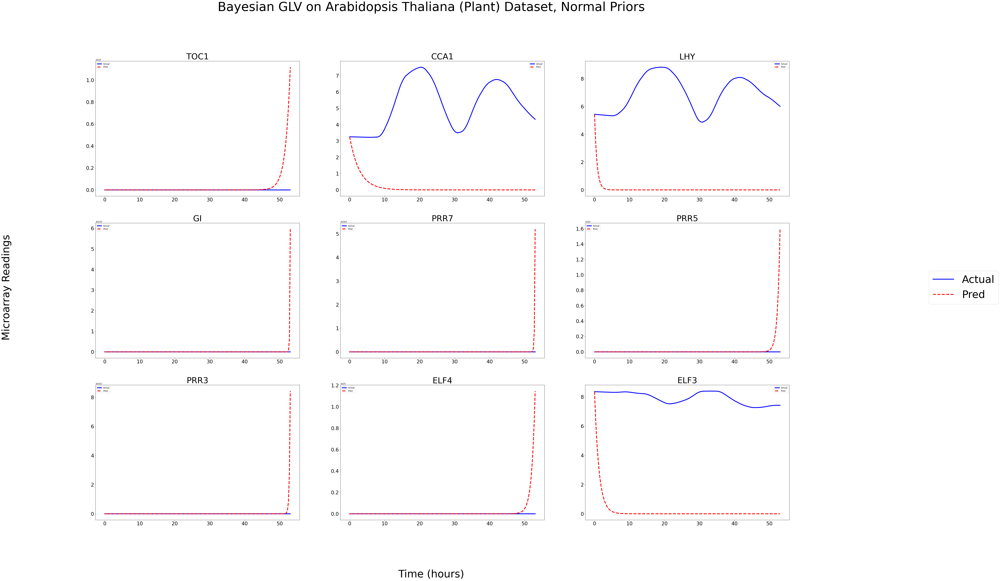

In [247]:
fig, axs = plt.subplots(3, 3,
                        figsize=(60, 40))

gene_cols = arab_smooth.iloc[:, 1:].columns.tolist()
time_vec_mh = arab_smooth['time'].values

for col in range(bayesian_glv_pred_df.shape[1]):
  r, c = divmod(col, 3)

  colname = gene_cols[col]

  arab_smooth.loc[:, colname].values

  axs[r, c].plot(time_vec_mh,
                 arab_smooth.loc[:, colname].values,
                 '-',
                 color='b',
                 label='Actual',
                 linewidth=4.0)
  axs[r, c].plot(time_vec_mh,
                 bayesian_glv_pred_df.loc[:, colname].values,
                 '--r',
                 label='Pred',
                 linewidth=4.0)
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)


# Plot
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('Microarray Readings', fontsize = 50)

suptitle_bglv = 'Bayesian GLV on Arabidopsis Thaliana (Plant) Dataset, Normal Priors'
plt.suptitle(suptitle_bglv, fontsize = 60)
plt.savefig(os.path.join(plots_arab_path, 'bglv_plant_traj_normal.png'))
plt.show()

## Interaction Matrix Posterior Heatmap

<ipython-input-248-df70b203b7ca>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "bayes_glv_plant_normal.png"))
<ipython-input-248-df70b203b7ca>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "bayes_glv_plant_normal.png"))
<ipython-input-248-df70b203b7ca>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, "bayes_glv_plant_normal.png"))
<ipython-input-248-df70b203b7ca>:4: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no long

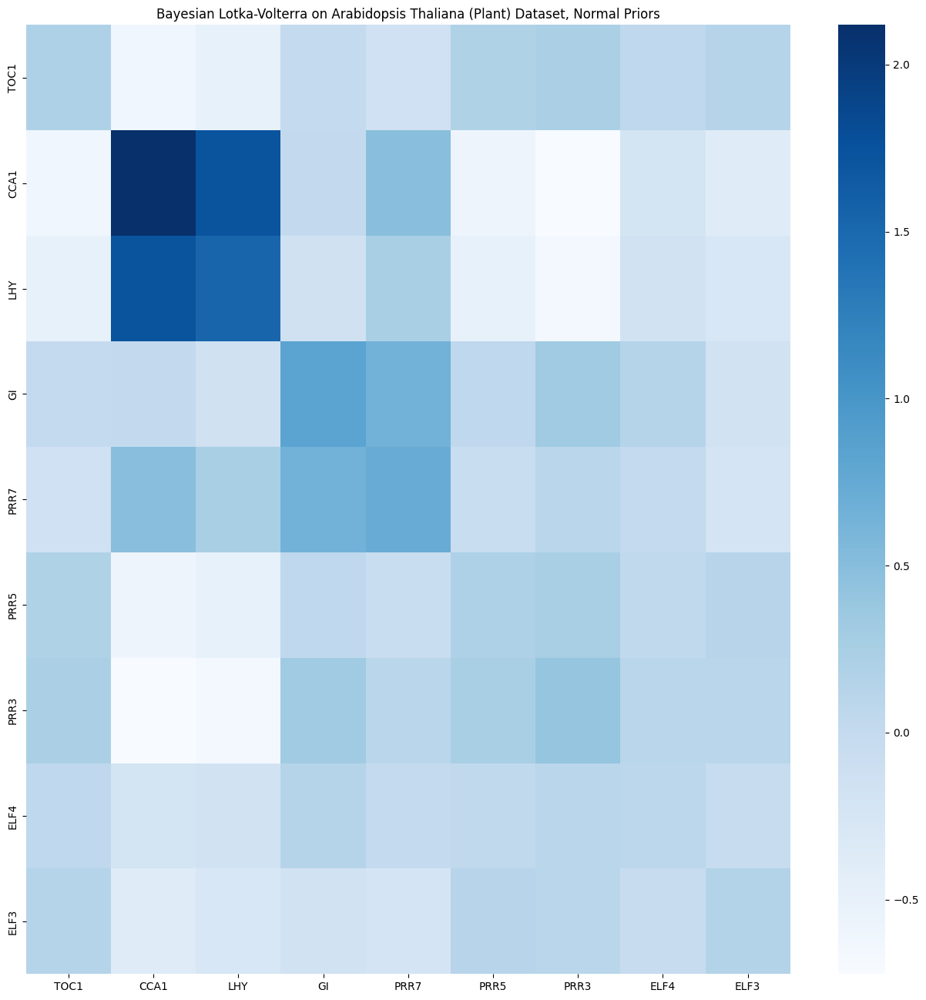

In [248]:

plt.figure(figsize=(16,16))
sns.heatmap(A_mh_df, cmap = 'Blues', xticklabels=True, yticklabels=True)
plt.title('Bayesian Lotka-Volterra on Arabidopsis Thaliana (Plant) Dataset, Normal Priors')
plt.savefig(os.path.join(plots_arab_path, "bayes_glv_plant_normal.png"))


### Interaction Matrix Prior - Gene Covariance Matrix Heatmap

To benchmark how much $A$ changes in the posterior

<AxesSubplot:>

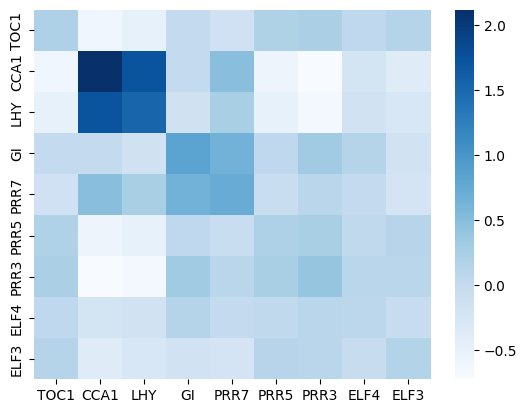

In [189]:
sns.heatmap(arab_smooth.iloc[:, 1:].cov(),
            cmap = 'Blues',
            xticklabels=True,
            yticklabels=True)


## Performance Metrics

In [255]:
bayes_glv_pooled_mse = pooled_mse(true_df = arab_smooth.iloc[:, 1:], pred_df = bayesian_glv_pred_df)
notnull_idx = bayesian_glv_pred_df.index[bayesian_glv_pred_df.isnull().sum(axis=1) == 0]
bayesian_glv_pred_df.iloc[notnull_idx]

/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


,TOC1,CCA1,LHY,GI,PRR7,PRR5,PRR3,ELF4,ELF3
0,8.673000e+00,3.253000e+00,5.432000e+00,6.446000e+00,3.621000e+00,6.166000e+00,6.691000e+00,7.642000e+00,8.353000e+00
1,1.061044e+01,2.955449e+00,3.682920e+00,7.653029e+01,2.476395e+01,9.034003e+00,2.202379e+01,1.016093e+01,6.742467e+00
2,1.298068e+01,2.685115e+00,2.497037e+00,9.086078e+02,1.693602e+02,1.323601e+01,7.249251e+01,1.351014e+01,5.442458e+00
3,1.588039e+01,2.439508e+00,1.693002e+00,1.078747e+04,1.158251e+03,1.939249e+01,2.386130e+02,1.796330e+01,4.393104e+00
4,1.942787e+01,2.216367e+00,1.147863e+00,1.280745e+05,7.921259e+03,2.841256e+01,7.854078e+02,2.388429e+01,3.546074e+00
...,...,...,...,...,...,...,...,...,...
211,5.187304e+17,3.391138e-08,2.512221e-32,4.850350e+206,3.455780e+160,3.724440e+32,9.050183e+99,3.876921e+24,1.256095e-17
212,6.226381e+17,3.108991e-08,1.766972e-32,4.558601e+207,1.970957e+161,5.263463e+32,2.661906e+100,5.017969e+24,1.034628e-17
213,7.617276e+17,2.824613e-08,1.198015e-32,5.412210e+208,1.347934e+162,7.711668e+32,8.761809e+100,6.671974e+24,8.351428e-18
214,9.318879e+17,2.566246e-08,8.122594e-33,6.425659e+209,9.218496e+162,1.129861e+33,2.883997e+101,8.871165e+24,6.741198e-18


In [256]:
bayes_glv_r2 = r2_score(y_true = arab_smooth.iloc[notnull_idx, 1:] // 10000, y_pred = bayesian_glv_pred_df.iloc[notnull_idx] // 10000)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)


In [210]:
bayes_glv_pooled_mse

inf

In [209]:
bayes_glv_r2

0.3333333333333333

In [265]:
compare_coupling(pred_df = pd.DataFrame(np.ones((25, 25))), true_df = pd.DataFrame(np.ones((25, 25))))

50.0

In [278]:
samps = list()
N = 25

for i in range(N_SNAPSHOTS):
  samp = compare_coupling(pred_df = pd.DataFrame(np.random.choice(a = [-1, 0, 1], size = (N, N))),
                  true_df = pd.DataFrame(np.ones((N, N))))
  samps.append(samp)

np.mean(samps)

32.23801167270956

In [289]:
1 - (32.23801167270956) / (2 * 25)

0.3552397665458088

In [279]:
samps = list()
N = 9

for i in range(N_SNAPSHOTS):
  samp = compare_coupling(pred_df = pd.DataFrame(np.random.choice(a = [-1, 0, 1], size = (N, N))),
                  true_df = pd.DataFrame(np.ones((N, N))))
  samps.append(samp)

np.mean(samps)

11.617428862752492

In [288]:
1 - (11.617428862752492) / (9 * 2)

0.3545872854026393

In [281]:
samps = list()
N = 2

for i in range(N_SNAPSHOTS):
  samp = compare_coupling(pred_df = pd.DataFrame(np.random.choice(a = [-1, 0, 1], size = (N, N))),
                  true_df = pd.DataFrame(np.ones((N, N))))
  samps.append(samp)

np.mean(samps)

2.4588777689235135

In [286]:
1 - (2.4588777689235135 / (2 * 2))

0.3852805577691216

In [282]:
samps = list()
N = 7

for i in range(N_SNAPSHOTS):
  samp = compare_coupling(pred_df = pd.DataFrame(np.random.choice(a = [-1, 0, 1], size = (N, N))),
                  true_df = pd.DataFrame(np.ones((N, N))))
  samps.append(samp)

np.mean(samps)

9.006905606640096

In [287]:
1 - 9.006905606640096 / (2 * 9)

0.49961635518666137

In [258]:
bayes_glv_A_normed = pd.DataFrame(A_mh / np.linalg.norm(A_mh),
                                  index = arab_smooth.iloc[:, 1:].columns.tolist(),
                                  columns = arab_smooth.iloc[:, 1:].columns.tolist())

bglv_coupling = compare_coupling(pred_df = bayes_glv_A_normed,
                                 true_df = true_adjacency)

In [259]:
print(f"Pooled MSE: {bayes_glv_pooled_mse}")
print(f"R2: {bayes_glv_r2}")
print(f"Coupling Degree: {bglv_coupling}")

Pooled MSE: inf
R2: 0.3333333333333333
Coupling Degree: 9.539392014169456


# Summary Results Across Methods

<ipython-input-195-5b1efca1ce76>:55: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'plant_all.png'))
<ipython-input-195-5b1efca1ce76>:55: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'plant_all.png'))
<ipython-input-195-5b1efca1ce76>:55: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_arab_path, 'plant_all.png'))
<ipython-input-195-5b1efca1ce76>:55: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 and will bec

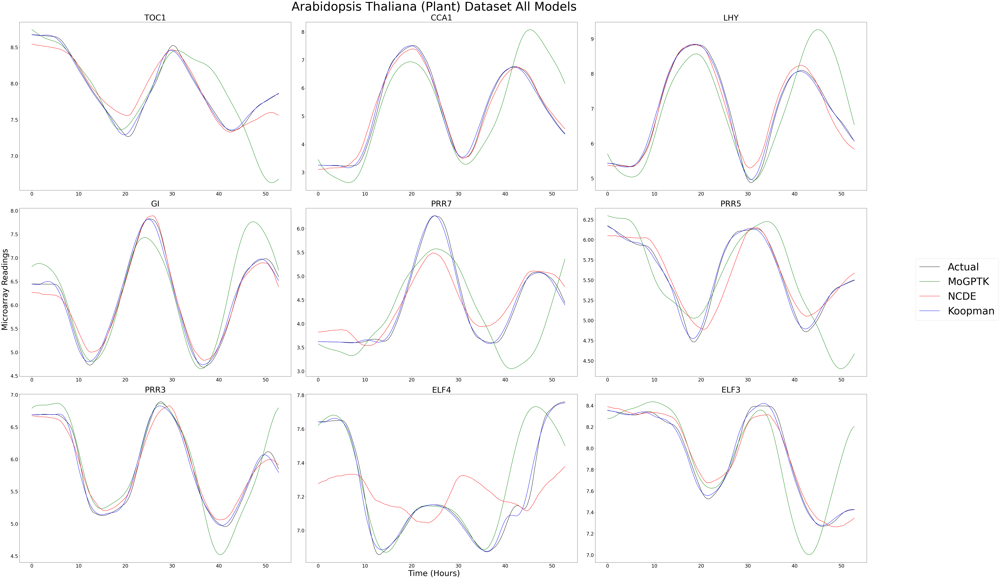

In [195]:
fig, axs = plt.subplots(3, 3, figsize = (60, 40), layout = "constrained")

gene_cols = arab_smooth.iloc[:, 1:].columns.tolist()

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 3)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:-1],
                 arab_smooth.iloc[:-1, :].loc[:, colname].values,
                 '-',
                 color='0',
                 label='Actual')

  axs[r, c].plot(time_vec[:-1],
                 mogptk_preds_df.iloc[:-1, :].loc[:, colname].values,
                 'g',
                 label='MoGPTK')

  axs[r, c].plot(time_vec[:-1],
                ncde_pred_df.loc[:, colname].values,
                label = 'NCDE',
                color='r')

  axs[r, c].plot(time_vec[:-1],
                 koopman_pred_df.iloc[:-1, :].loc[:, colname].values,
                 label='Koopman',
                 color='b')

  # axs[r, c].plot(time_vec[:-1],
  #                bayesian_glv_pred_df.iloc[:-1, :].loc[:, colname].values,
  #                label='Bayes GLV',
  #                color='c')

  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)

fig.supxlabel('Time (Hours)', fontsize = 40)
fig.supylabel('Microarray Readings', fontsize = 40)

for a in axs.flatten():
    a.tick_params(axis='both', which='major', labelsize=24)
    a.tick_params(axis='both', which='minor', labelsize=20)

# Get handles and labels from one of the subplots
handles, labels = axs[0, 0].get_legend_handles_labels()

fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), ncol = 1,
           loc='center left', fontsize = 50)

suptitle_all = 'Arabidopsis Thaliana (Plant) Dataset All Models'
plt.suptitle(suptitle_all, fontsize = 60)
plt.savefig(os.path.join(plots_arab_path, 'plant_all.png'))
plt.show()

# Appendix

## NCDE Trial Runs

### NCDE Run: 4/13/2025 6:35 PM, 500 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.550537109375, Accuracy: 3595.550537109375, Computation time: 21.925617933273315
Step: 1, Loss: 3555.825927734375, Accuracy: 3555.825927734375, Computation time: 1.09849214553833
Step: 2, Loss: 3507.551025390625, Accuracy: 3507.551025390625, Computation time: 1.6345157623291016
Step: 3, Loss: 3487.687255859375, Accuracy: 3487.687255859375, Computation time: 0.76163649559021
Step: 4, Loss: 3472.209228515625, Accuracy: 3472.209228515625, Computation time: 0.6960725784301758
Step: 5, Loss: 3440.94921875, Accuracy: 3440.94921875, Computation time: 0.8357787132263184
Step: 6, Loss: 3413.404296875, Accuracy: 3413.404296875, Computation time: 0.8866899013519287
Step: 7, Loss: 3391.3505859375, Accuracy: 3391.3505859375, Computation time: 1.196861982345581
Step: 8, Loss: 3376.815917

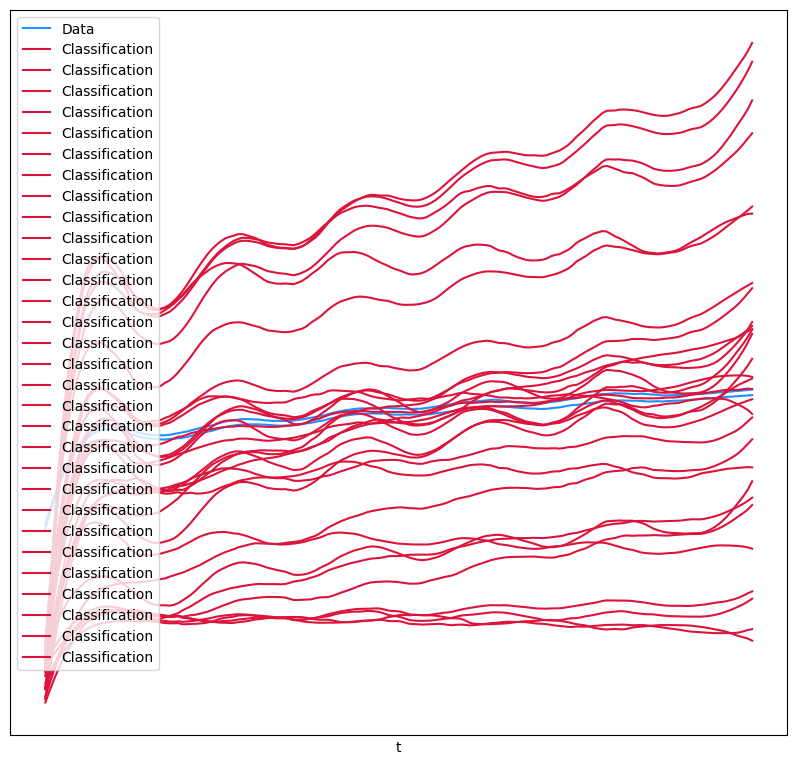

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:25PM, 200 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.26220703125, Accuracy: 3595.26220703125, Computation time: 26.537452697753906
Step: 1, Loss: 3555.12841796875, Accuracy: 3555.12841796875, Computation time: 0.9068377017974854
Step: 2, Loss: 3507.05810546875, Accuracy: 3507.05810546875, Computation time: 0.8603711128234863
Step: 3, Loss: 3488.76220703125, Accuracy: 3488.76220703125, Computation time: 0.7739553451538086
Step: 4, Loss: 3471.976318359375, Accuracy: 3471.976318359375, Computation time: 0.7465741634368896
Step: 5, Loss: 3441.75390625, Accuracy: 3441.75390625, Computation time: 0.8720881938934326
Step: 6, Loss: 3413.742919921875, Accuracy: 3413.742919921875, Computation time: 1.4321730136871338
Step: 7, Loss: 3391.753662109375, Accuracy: 3391.753662109375, Computation time: 2.754321813583374
Step: 8, Loss: 3376.

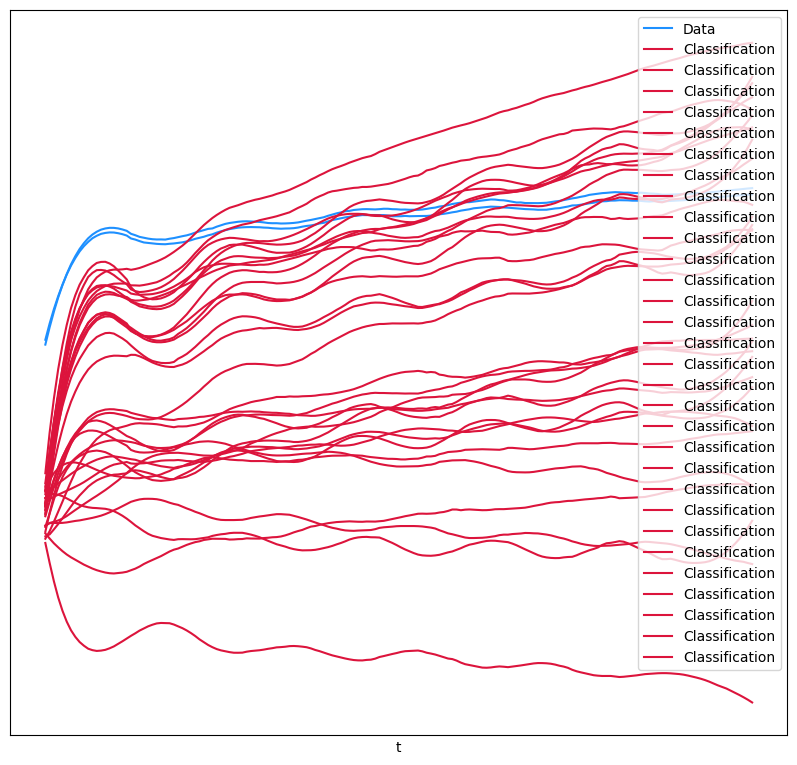

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:00PM, 100 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.312744140625, Accuracy: 3595.312744140625, Computation time: 19.95695424079895
Step: 1, Loss: 3555.794921875, Accuracy: 3555.794921875, Computation time: 1.4375996589660645
Step: 2, Loss: 3506.536376953125, Accuracy: 3506.536376953125, Computation time: 1.3460593223571777
Step: 3, Loss: 3487.83447265625, Accuracy: 3487.83447265625, Computation time: 1.1185424327850342
Step: 4, Loss: 3472.236083984375, Accuracy: 3472.236083984375, Computation time: 0.6792178153991699
Step: 5, Loss: 3441.907470703125, Accuracy: 3441.907470703125, Computation time: 0.7658653259277344
Step: 6, Loss: 3413.754150390625, Accuracy: 3413.754150390625, Computation time: 0.8729970455169678
Step: 7, Loss: 3391.171630859375, Accuracy: 3391.171630859375, Computation time: 1.066856861114502
Step: 8, Loss: 3376.109130859375, Accuracy: 3

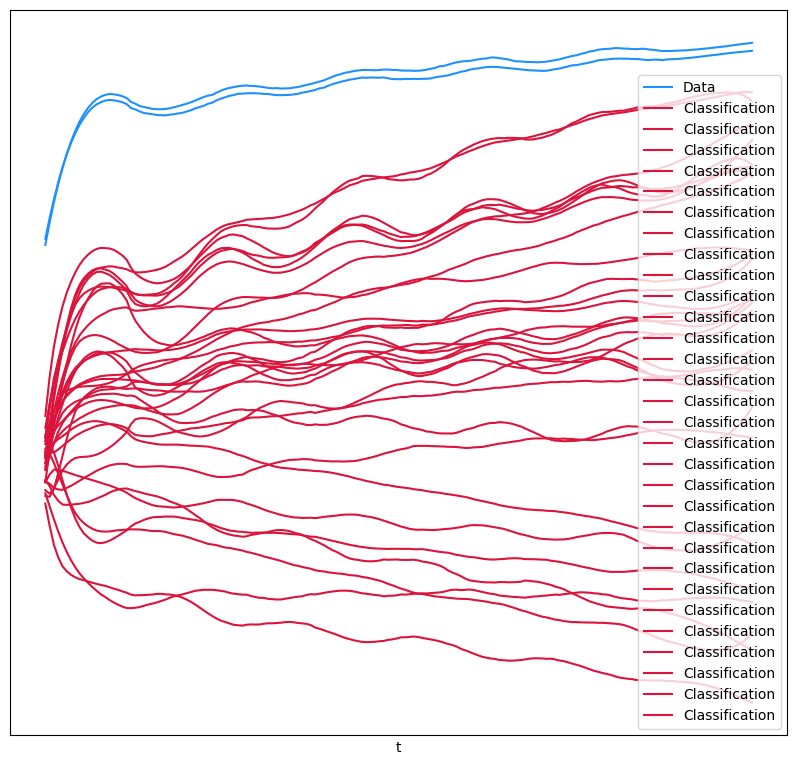

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

## Train-test split